# PyCPT version 2.5.1

This is an example of a PyCPT Version 2 seasonal climate forecasting workflow. This notebook can be adapted to suit your exact needs through modifications of the code. This notebook uses PyCPT v2 utilities to 

1. download data from the IRI Data Library (through the CPT-DL python library) 
2. Run bias-correction using the IRI Climate Predictability Tool (through its companion python library, CPT-CORE) 
3. Plot skills scores and spatial loadings
4. Produce a multi-model ensemble forecast by taking the simple average of the bias-corrected members
5. Plots skill scores, deterministic forecasts, probabilistic forecasts, and exceedance probabilities for this NextGen MME forecast. 

PyCPT Version 2 was primarily designed and implemented by Kyle Hall.

## Function documentation
To get help on a function, e.g. `pycpt.setup`, run the following command in a new cell:
```
pycpt.setup?
```
To see the function's source code, use two question marks instead of one.

#### Imports - This cell imports PyCPTv2 libraries 

In [1]:
import pycpt
import packaging
min_version = '2.5.0'
assert packaging.version.parse(pycpt.__version__) >= packaging.version.parse(min_version), f'This notebook requires version {min_version} or higher of the pycpt library, but you have version {pycpt.__version__}. Please close the notebook, update your environment, and load the notebook again. See https://iri-pycpt.github.io/installation/'

import cptdl as dl 
from cptextras import get_colors_bars
import datetime as dt
import numpy as np
from pathlib import Path
import xarray as xr

In [2]:
import pandas as pd
import numpy as np
import datetime
from mpl_toolkits.basemap import Basemap
import matplotlib.colors as colors
import matplotlib.pyplot as plt
all_models = pd.DataFrame(dl.catalog.forecasts.keys())

all_models.columns = ['models']

In [3]:
dl.catalog.observations.keys()

dict_keys(['ENACTS-BANGLADESH.PRCP', 'ENACTS-BANGLADESH.TMEAN', 'ENACTS-BANGLADESH.TMIN', 'ENACTS-BANGLADESH.TMAX', 'ENACTS-COLOMBIA.PRCP', 'ENACTS-COLOMBIA.TMIN', 'ENACTS-COLOMBIA.TMAX', 'ENACTS-GAMBIA.PRCP', 'ENACTS-GAMBIA.TMIN', 'ENACTS-GAMBIA.TMAX', 'ENACTS-GUATEMALA.PRCP', 'ENACTS-ICPAC.PRCP', 'ENACTS-VIETNAM.PRCP', 'ENACTS-VIETNAM.TMEAN', 'ENACTS-VIETNAM.TMIN', 'ENACTS-VIETNAM.TMAX', 'CHILESTATIONS.PRCP', 'CHILESTATIONS.TMAX', 'CHILESTATIONS.TMIN', 'UCSB.PRCP', 'UCSB0p05.PRCP', 'UCSB.TMAX', 'UCSB.TMIN', 'UCSB.TMEAN', 'CPCCMAPURD.PRCP', 'TRMM.PRCP', 'ERSSTV5.SST'])

In [4]:
all_models

has_an = all_models['models'].str.contains(pat='PRCP', regex=False)
filtered_df = all_models[has_an] 

#np.array(filtered_df.models)

In [5]:
def sel_inputs(predictor, domain):

    if domain == 'sadc':
        predictand_extent = {
        'east':  60,
        'west': 5, 
        'north': 10,
        'south': -40, }
    elif domain == 'botswana':
        predictand_extent = {
        'east':  30,
        'west': 19, 
        'north': -17,
        'south': -27, }
    else:
        print('The domain yet to be defined')
    
    if predictor == 'nino34':
        predictor_var = 'SST'
        predictor_extent = {
        'east':  -120,
        'west': -170, 
        'north': 5,
        'south': -5, }
    elif predictor == 'nino3':
        predictor_var = 'SST'
        predictor_extent = {
        'east':  -90,
        'west': -150, 
        'north': 5,
        'south': -5, }
    elif predictor == 'nino4':
        predictor_var = 'SST'
        predictor_extent = {
        'east':  -150,
        'west': 160, 
        'north': 5,
        'south': -5, }
    elif predictor == 'SEEIO': # south eastern equatorial Indian Ocean
        predictor_var = 'SST'
        predictor_extent = {
        'east':  110,
        'west': 90, 
        'north': 0,
        'south': -10, }
    elif predictor == 'PRCP': # 
        predictor_var = 'PRCP'
        predictor_extent = predictand_extent
    else:
        print('The predictor yet to be defined')
        
    return predictor_var, predictor_extent, predictand_extent


#### Parameters - This cell defines the parameters of your CPT analysis

#### Define case directory
The directory where inputs, outputs, and figures generated by this notebook will be stored.

In [6]:
##  Function to define paramenters for the target season (target_seas) given the initialization month (init_mon) 

def sel_seas(target_seas, init_mon):
    
    if init_mon == 8:
        target_seasons = ['SON', 'OND', 'NDJ', 'DJF']
        fdate = dt.datetime(init_year, init_mon, 1)
        if target_seas == 'SON':
            lead_low = 0.5
            lead_high = 2.5
            target = 'Sep-Nov'
        elif target_seas == 'OND':
            lead_low = 1.5
            lead_high = 3.5
            target = 'Oct-Dec'
        elif target_seas == 'NDJ':
            lead_low = 2.5
            lead_high = 4.5
            target = 'Nov-Jan'
        elif target_seas == 'DJF':
            lead_low = 3.5
            lead_high = 5.5
            target = 'Dec-Feb'
        else:
            print('Target season either out of forecast period or something')
    elif init_mon == 9:
        fdate = dt.datetime(init_year, init_mon, 1)
        target_seasons = ['OND', 'NDJ', 'DJF', 'JFM']
        if target_seas == 'OND':
            lead_low = 0.5
            lead_high = 2.5
            target = 'Oct-Dec'
        elif target_seas == 'NDJ':
            lead_low = 1.5
            lead_high = 3.5
            target = 'Nov-Jan'
        elif target_seas == 'DJF':
            lead_low = 2.5
            lead_high = 4.5
            target = 'Dec-Feb'
        elif target_seas == 'JFM':
            lead_low = 3.5
            lead_high = 5.5
            target = 'Jan-Mar'
        else:
            print('Target season either out of forecast period or something')

    elif init_mon == 10:
        fdate = dt.datetime(init_year, init_mon, 1)
        target_seasons = ['NDJ', 'DJF', 'JFM', 'FMA']
        if target_seas == 'NDJ':
            lead_low = 0.5
            lead_high = 2.5
            target = 'Nov-Jan'
        elif target_seas == 'DJF':
            lead_low = 1.5
            lead_high = 3.5
            target = 'Dec-Feb'
        elif target_seas == 'JFM':
            lead_low = 2.5
            lead_high = 4.5
            target = 'Jan-Mar'
        elif target_seas == 'FMA':
            lead_low = 3.5
            lead_high = 5.5
            target = 'Feb-Apr'
        else:
            print('Target season either out of forecast period or something')
    
    elif init_mon == 11:
        fdate = dt.datetime(init_year, init_mon, 1)
        target_seasons = ['DJF', 'JFM', 'FMA', 'MAM']
        if target_seas == 'DJF':
            lead_low = 0.5
            lead_high = 2.5
            target = 'Dec-Feb'
        elif target_seas == 'JFM':
            lead_low = 1.5
            lead_high = 3.5
            target = 'Jan-Mar'
        elif target_seas == 'FMA':
            lead_low = 2.5
            lead_high = 4.5
            target = 'Feb-Apr'
        elif target_seas == 'MAM':
            lead_low = 3.5
            lead_high = 5.5
            target = 'Mar-May'
        else:
            print('Target season either out of forecast period or something')
        
    elif init_mon == 12:
        fdate = dt.datetime(init_year, init_mon, 1)
        target_seasons = ['JFM', 'FMA', 'MAM' ]
        if target_seas == 'JFM':
            lead_low = 0.5
            lead_high = 2.5
            target = 'Jan-Mar'
        elif target_seas == 'FMA':
            lead_low = 1.5
            lead_high = 3.5
            target = 'Feb-Apr'
        elif target_seas == 'MAM':
            lead_low = 2.5
            lead_high = 4.5
            target = 'Mar-May'
        elif target_seas == 'AMJ':
            lead_low = 3.5
            lead_high = 5.5
            target = 'Apr-Jun'
        else:
            print('Target season either out of forecast period or something')
            
    elif init_mon == 1:
        fdate = dt.datetime(init_year, init_mon, 1)
        target_seasons = ['FMA', 'MAM', 'AMJ' ]
        if target_seas == 'FMA':
            lead_low = 0.5
            lead_high = 2.5
            target = 'Feb-Apr'
        elif target_seas == 'MAM':
            lead_low = 1.5
            lead_high = 3.5
            target = 'Mar-May'
        elif target_seas == 'AMJ':
            lead_low = 2.5
            lead_high = 4.5
            target = 'Apr-Jun'
        elif target_seas == 'MJJ':
            lead_low = 3.5
            lead_high = 5.5
            target = 'May-Jul'
        else:
            print('Target season either out of forecast period or something')       
    
    else:
        print('Initialization month currently not being considered')
        
    # function body 

    return init_mon, fdate, target_seas, target, lead_low, lead_high
    

In [7]:
now = datetime.datetime.now()
days = datetime.timedelta(days = 30)
last_date = now - days
current_mon = now.strftime("%m")
current_year = now.strftime("%Y")


latest_init_month = last_date.strftime("%m")
latest_init_year = last_date.strftime("%Y")

init_year = np.int32(latest_init_year)
init_month = np.int32(latest_init_month)


### These are the only values that need to be changed

In [8]:

MOS = 'PCR' # must be one of 'CCA', 'PCR'

target_seas = 'FMA'
init_mon = init_month # Can only be changed if one needs an initialization other than from the last month
predictand_var = 'PRCP'
predictor = 'nino34' # Currently takes 'nino34', 'nino3', 'nino4', 'SEEIO', 'predictand_var'
domain = 'sadc'  # Currently takes 'sadc' and 'botswana'


In [9]:
define_params = sel_seas(target_seas, init_mon)
predictor_var, predictor_extent, predictand_extent = sel_inputs(predictor, domain)

In [10]:
# Use dl.observations.keys() to see all options for predictand 
# and dl.hindcasts.keys() to see all options for predictors.
# Make sure your first_year & final_year are compatible with 
# your selections for your predictors and predictands.
#predictor_names = [ "SPEAR.PRCP", "CCSM4.PRCP", CanCM4i, CanSIPSv2, GEMNEMO, CanSIPSIC3, GEM5NEMO, CanCM3, CanCM4, AER04, FLORB01, ]
predictor_names = np.array(filtered_df.models)

not_available = ['GLOSEA5.PRCP',  'GLOSEA6.PRCP', 'METEOFRANCE7.PRCP', 'CPS2.PRCP', 'SEAS5.PRCP','GCFS2p0.PRCP', 'SPSv3p0.PRCP', 'FLORA06.PRCP','FLORB01.PRCP','CanCM4.PRCP', 'CanCM3.PRCP', 'CanSIPSv2.PRCP','AER04.PRCP']

predictor_names = ['CanCM4i.'+predictor_var, 'GEMNEMO.'+predictor_var, 'CanSIPSIC3.'+predictor_var, 'GEM5NEMO.'+predictor_var, 
                   'CCSM4.'+predictor_var, 'SPEAR.'+predictor_var, 'GEOSS2S.'+predictor_var, 'CFSv2.'+predictor_var, 'SPSv3p5.'+predictor_var,
                   'GCFS2p1.'+predictor_var, 'SEAS51.'+predictor_var, 'METEOFRANCE8.'+predictor_var]

#predictor_names = ['CCSM4.'+predictor_var, 'SPEAR.'+predictor_var ] #, 'SEAS51.PRCP', 'METEOFRANCE8.PRCP', 'CanCM4i.PRCP', 'GEMNEMO.PRCP']

predictand_name = 'UCSB.'+predictand_var

# To download predictand observations from the Data Library, set
#
#   local_predictand_file = None
#
# To read predictand data from a local file instead,
# set local_predictand_file to the full pathname of the file. e.g.
#
#   local_predictand_file = "/home/aaron/src/pycpt_notebooks/obs_PRCP_Oct-Dec.tsv"
#
# The file should be formatted according to the following guidelines:
# https://cpthelp.iri.columbia.edu/CPT_use_input_gridded.html7
local_predictand_file = None



download_args = { 
    # 'fdate':
    #   The initialization date of the model forecasts / hindcasts.
    #   This field is defined by a python datetime.datetime object,
    #   for example: dt.datetime(2022, 5, 1) # YYYY, MM, DD as integers
    #   The year field is only used for forecasts, otherwise ignored.
    #   The day field is only used in subseasonal forecasts, otherwise ignored.
    #   The month field is an integer representing a month - ie, May=5.
    'fdate': define_params[1],
    # 'fdate':  dt.datetime(2023, 11, 1),

    # 'first_year':
    #   The first year of hindcasts you want. **NOT ALL MODELS HAVE ALL YEARS**.
    #   Double check that your model has hindcast data for all years in [first_year, final_year].
    #   This field is defined by a python integer representing a year, e.g. 1993.
    'first_year': 1993,  

    # 'final_year':
    #   The final year of hindcasts you want. **NOT ALL MODELS HAVE ALL YEARS**.
    #   Double check that your model has hindcast data for all years in [first_year, final_year].
    #   This field is defined by a python integer representing a year, e.g. 2016.
    'final_year': 2015,  

    # 'lead_low': 
    #   The number of months from the first of the initialization month to the center of 
    #   the first month included in the target period. Always an integer + 0.5. 
    #   This field is defined by a python floating point number 
    #   for example  a lead-1 forecast would use lead_low=1.5, if you want init=may, target=Jun-..
    'lead_low': define_params[4],
    # 'lead_low': 2.5,

    # 'lead_high': 
    #   The number of months from the first of the initialization month to the center of 
    #   the last month included in the target period. Always an integer + 0.5. 
    #   This field is defined by a python floating point number 
    #   for example  a forecast initialized in may, whose target period ended in Aug, 
    #   would use lead_high=3.5
    'lead_high': define_params[5], 
    #'lead_high': 4.5, 

    # 'target': 
    #   Mmm-Mmm indicating the months included in the target period of the forecast. 
    #   This field is defined by a python string, with two three-letter month name abbreviations 
    #   whose first letters are capitalized, and all other letters are lowercase
    #   and who are separated by a dash character. 
    #   For example, if you wanted a JJA target period, you would use 'Jun-Aug'.
    'target': define_params[3],
    #'target': 'Jan-Mar',

    # 'predictor_extent':
    #   The geographic bounding box of the climate model data you want to download.
    #   This field is defined by a python dictionary with the keys "north", "south",
    #   "east", and "west", each of which maps to a python integer representing the 
    #   edge of a bounding box. i.e., "north" will be the northernmost boundary,
    #   "south" the southernmost boundary.
    #   Example: {"north": 90, "south": -90, "east": 0, "west": 180}
    'predictand_extent': predictand_extent,

    # 'predictand_extent':
    #   The geographic bounding box of the observation data you want to download.
    #   This field is defined by a python dictionary with the keys "north", "south",
    #   "east", and "west", each of which maps to a python integer representing the 
    #   edge of a bounding box. i.e., "north" will be the northernmost boundary,
    #   "south" the southernmost boundary.
    #   Example: {"north": 90, "south": -90, "east": 0, "west": 180}
    'predictor_extent': predictor_extent,

    # 'filetype':
    #   The filetype to be downloaded. for now, it saves a lot of headache just to set this equal
    #   to 'cptv10.tsv' which is a boutique plain-text CPT filetype based on .tsv + metadata.
    'filetype': 'cptv10.tsv'
}

cpt_args = { 
    'transform_predictand': None,  # transformation to apply to the predictand dataset - None, 'Empirical', 'Gamma'
    'tailoring': None,  # tailoring None, 'Anomaly'
    'cca_modes': (1,3), # minimum and maximum of allowed CCA modes 
    'x_eof_modes': (1,8), # minimum and maximum of allowed X Principal Componenets 
    'y_eof_modes': (1,6), # minimum and maximum of allowed Y Principal Components 
    'validation': 'crossvalidation', # the type of validation to use; only 'crossvalidation' is supported for now
    'drymask': False, #whether or not to use a drymask of -999
    'scree': True, # whether or not to save % explained variance for eof modes
    'crossvalidation_window': 5,  # number of samples to leave out in each cross-validation step 
    'synchronous_predictors': True, # whether or not we are using 'synchronous predictors'
}

In [11]:
if MOS == 'PCR':
    mos_lc = 'pcr'
if MOS == 'CCA':
    mos_lc = 'cca'
    
download_args_defined = list(download_args.values()) 
f_seas = list(download_args.values())[5]
in_year = str(list(download_args.values())[0].year)
in_month = str(list(download_args.values())[0].month)

case_dir = '/home/tnkemelang/Data/ATKINS/pycpt/'+domain+'/'+ predictand_var+ '/'+ f_seas +'_'+ in_year+in_month+'/'+predictor+ '-'+  MOS

In [12]:
case_dir = Path(case_dir)

Set `force_download = False` to avoid re-downloading files you have already downloaded. Note: if you have changed anything in `download_args` since the data were last downloaded, you must set `force_download = True`, otherwise you will use the old data instead of the new.

In [13]:
force_download = False

In [14]:
# Modifications to pycpt.setup to define domain_dir

In [15]:
domain_dir = pycpt.setup(case_dir, download_args["predictor_extent"])

Input data will be saved in /home/tnkemelang/Data/ATKINS/pycpt/sadc/PRCP/Feb-Apr_20241/nino34-PCR/data
Figures will be saved in /home/tnkemelang/Data/ATKINS/pycpt/sadc/PRCP/Feb-Apr_20241/nino34-PCR/figures
Output will be saved in /home/tnkemelang/Data/ATKINS/pycpt/sadc/PRCP/Feb-Apr_20241/nino34-PCR/output


#### Visualize predictor and predictand domains

/home/tnkemelang/miniconda3/envs/pycpt_env/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/tnkemelang/miniconda3/envs/pycpt_env/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '


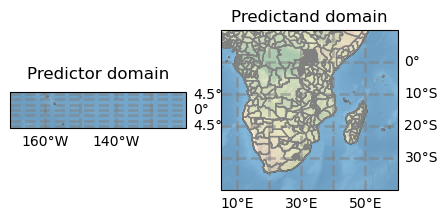

In [16]:
pycpt.plot_domains(download_args['predictor_extent'], download_args['predictand_extent'])

#### Download Observations, Hindcasts, and Forecasts from IRI Data Library

In [17]:
Y, hindcast_data, forecast_data = pycpt.download_data(predictand_name, local_predictand_file, predictor_names, download_args, domain_dir, force_download)

URL: https://iridl.ldeo.columbia.edu/SOURCES/.UCSB/.CHIRPS/.v2p0/.daily-improved/.global/.0p25/.prcp/89.25/mul/T/(1%20Jan%201993)/(31%20Dec%202015)/RANGE/T/%28Feb-Apr%201993-2015%29/seasonalAverage/Y/%28-40%29/%2810%29/RANGEEDGES/X/%285%29/%2860%29/RANGEEDGES/-999/setmissing_value/%5BX/Y%5D%5BT%5Dcptv10.tsv

DOWNLOADING: [*************************] (14357 KB) 0:00:58.565497
URL: https://iridl.ldeo.columbia.edu/SOURCES/.Models/.NMME/.CanSIPS-IC3/.CanCM4i-IC3/.HINDCAST/.MONTHLY/.sst/SOURCES/.Models/.NMME/.CanCM4i/.FORECAST/.MONTHLY/.sst/S/(1%20Jan%202021)/(1%20Sep%202021)/RANGEEDGES/appendstream/SOURCES/.Models/.NMME/.CanSIPS-IC3/.CanCM4i-IC3/.FORECAST/.MONTHLY/.sst/appendstream/S/%280000%201%20Jan%201993-2015%29/VALUES/L/0.5/2.5/RANGEEDGES/%5BL%5D//keepgrids/average/%5BM%5D/average/Y/-5/5/RANGEEDGES/X/-170/-120/RANGEEDGES/-999/setmissing_value/%5BX/Y%5D%5BL/S/add%5D/cptv10.tsv,

DOWNLOADING: [*************************] (200 KB) 0:00:06.246435
URL: https://iridl.ldeo.columbia.edu/SOURCES

#### Perform CPT Analysis
Set `interactive = True` to see detailed output from CPT.

In [18]:
interactive = False

In [19]:
hcsts, fcsts, skill, pxs, pys = pycpt.evaluate_models(hindcast_data, MOS, Y, forecast_data, cpt_args, domain_dir, predictor_names, interactive)

  
 Forecast probabilities:
  
  
 Date: 2023/24 Dec
 Climatology:
     DJF 1991/92 to DJF 2020/21
      Lat      Lon     Below    Normal     Above
  
    4.88N   10.12E       47%       20%       33%
    4.88N   10.38E       48%       21%       31%
    4.88N   10.62E       44%       26%       30%
    4.88N   10.88E       51%       21%       28%
    4.88N   11.12E       53%       19%       28%
    4.88N   11.38E       50%       24%       25%
    4.88N   11.62E       51%       17%       32%
    4.88N   11.88E       51%       19%       30%
    4.88N   12.12E       47%       26%       28%
    4.88N   12.38E       50%       22%       28%
    4.88N   12.62E       56%       18%       26%
    4.88N   12.88E       60%       15%       25%
    4.88N   13.12E       60%       20%       19%
    4.88N   13.38E       64%       21%       16%
    4.88N   13.62E       65%       21%       15%
    4.88N   13.88E       66%       20%       15%
    4.88N   14.12E       69%       14%       17%
    4.88N   14.3

 Saving: /home/tiro/.pycpt_workspace/21750409-2c42-4edb-b0ef-4c33c413df01/predictand_eof_spatial_loadings.txt
  
 Done!
  
 _______________________________________________________________________________
  
 Climate Predictability Tool 17   - Canonical Correlation Analysis
  
                                     X File
  
 Input Data                                 original_predictor
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 1991
 Number of fields                           1
 Number of seasons                          1
 Number of gridpoints                       2116
 Number of variables used                   2116
  
                                     Y File
  
 Input Data                                 original_predictand
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                       

  
  
             C L I M A T E   P R E D I C T A B I L I T Y   T O O L
                                 Version 17.08
  
                   Evaluating seasonal climate predictability
                         Designed for MOS applications
  
  
  Copyright 2002-2023 International Research Institute for Climate and Society
  
  
 III RRRR  III                                                                 
  I  R   R  I                                                                  
  I  R   R  I                                                                  
  I  RRRR   I                                                                  
  I  R   R  I   I N T E R N A T I O N A L   R E S E A R C H   I N S T I T U T E
 III R   R III  F O R         C L I M A T E         A N D         S O C I E T Y
  
  
 FILE
       141.  New
       142.  Open
       144.  Save As
       145.  Save as Parameter File (turn on)
       131.  Output-file format
       132.  Output-data precision
       1

1
 X Input File:  
/home/tiro/.pycpt_workspace/59104844-d1d9-471a-af5b-6240a58a0bf8/original_predictor
  
  
                                Data Domain (X)
  
  
 Data Domain (X):
 Domain limits:
 (Southern latitudes and western longitudes negatives)
 (Approximate data limits in brackets)
  
 Northernmost latitude (   5):  
5.0
 Southernmost latitude ( -40):  
-40.0
 Westernmost longitude (  10):  
10.0
 Easternmost longitude (  55):  
55.0
  
  
  
                                X Modes Options
  
  
 Number of modes (X):
 Minimum number of modes:  
1
 Maximum number of modes:  
8
  
  
 _______________________________________________________________________________
  
 Climate Predictability Tool 17   - Canonical Correlation Analysis
  
                                     X File
  
 Input Data                                 original_predictor
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                  

  
 Reading data ...
 Reading /home/tiro/.pycpt_workspace/59104844-d1d9-471a-af5b-6240a58a0bf8/original_predictand ...
 Reading /home/tiro/.pycpt_workspace/59104844-d1d9-471a-af5b-6240a58a0bf8/original_predictor ...
  
 Checking for missing values ...
  
 Calculating climatologies and thresholds ...
 Climatological Period: DJF 1991/92 to DJF 2020/21
  
 Beginning analysis ...
 Optimizing cross-validated performance ...
 Training period: DJF 1991/92 to DJF 2020/21
  
               CURRENT                         OPTIMUM
  
      Number of Modes    Goodness      Number of Modes    Goodness
         X    Y   CCA       Index         X    Y   CCA       Index
  
         1    1     1       0.071         1    1     1       0.071
         1    2     1       0.080         1    2     1       0.080
         1    3     1       0.082         1    3     1       0.082
         1    4     1       0.082         1    4     1       0.082
         1    5     1       0.081         1    4     1       0.082

  
 Calculating 2AFC score ...
 Done!
 Skill Scores Output file:  CPT 
/home/tiro/.pycpt_workspace/59104844-d1d9-471a-af5b-6240a58a0bf8/2afc
 Saving: /home/tiro/.pycpt_workspace/59104844-d1d9-471a-af5b-6240a58a0bf8/2afc.txt
  
 Done!
  
 _______________________________________________________________________________
  
 Climate Predictability Tool 17   - Canonical Correlation Analysis
  
                                     X File
  
 Input Data                                 original_predictor
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 1991
 Number of fields                           1
 Number of seasons                          1
 Number of gridpoints                       2116
 Number of variables used                   2116
  
                                     Y File
  
 Input Data                                 original_predictand
 First data               

 Saving: /home/tiro/.pycpt_workspace/59104844-d1d9-471a-af5b-6240a58a0bf8/roc_above.txt
  
 Done!
  
 _______________________________________________________________________________
  
 Climate Predictability Tool 17   - Canonical Correlation Analysis
  
                                     X File
  
 Input Data                                 original_predictor
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 1991
 Number of fields                           1
 Number of seasons                          1
 Number of gridpoints                       2116
 Number of variables used                   2116
  
                                     Y File
  
 Input Data                                 original_predictand
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 1991
 

 Reading /home/tiro/.pycpt_workspace/59104844-d1d9-471a-af5b-6240a58a0bf8/original_forecast_predictor ...
  
 Calculating forecasts ...
  
 Done!
  
 Forecasts:
  
  
 Date: 2023/24 Dec
 Climatology:
     DJF 1991/92 to DJF 2020/21
      Lat      Lon   Forecast      Lower      Upper
  
    4.88N   10.12E     27.602      0.000     60.601
    4.88N   10.38E     23.547      0.000     50.908
    4.88N   10.62E     17.251      0.000     39.198
    4.88N   10.88E     11.734      0.000     31.766
    4.88N   11.12E      8.907      0.000     25.568
    4.88N   11.38E     10.408      0.000     30.771
    4.88N   11.62E     15.303      0.000     38.972
    4.88N   11.88E     15.543      0.000     40.845
    4.88N   12.12E     15.731      0.000     43.279
    4.88N   12.38E     14.291      0.000     40.320
    4.88N   12.62E     17.130      0.000     41.715
    4.88N   12.88E     18.637      0.000     44.552
    4.88N   13.12E     19.323      0.000     45.894
    4.88N   13.38E     19.571      0.

  
 Forecast probabilities:
  
  
 Date: 2023/24 Dec
 Climatology:
     DJF 1991/92 to DJF 2020/21
      Lat      Lon     Below    Normal     Above
  
    4.88N   10.12E       59%       18%       22%
    4.88N   10.38E       60%       19%       21%
    4.88N   10.62E       58%       24%       19%
    4.88N   10.88E       65%       18%       16%
    4.88N   11.12E       68%       16%       16%
    4.88N   11.38E       65%       21%       14%
    4.88N   11.62E       66%       14%       20%
    4.88N   11.88E       65%       16%       19%
    4.88N   12.12E       60%       23%       17%
    4.88N   12.38E       64%       19%       17%
    4.88N   12.62E       70%       14%       16%
    4.88N   12.88E       73%       12%       15%
    4.88N   13.12E       73%       16%       11%
    4.88N   13.38E       76%       15%        9%
    4.88N   13.62E       77%       15%        8%
    4.88N   13.88E       78%       15%        7%
    4.88N   14.12E       80%       11%        9%
    4.88N   14.3

 Saving: /home/tiro/.pycpt_workspace/59104844-d1d9-471a-af5b-6240a58a0bf8/predictor_eof_spatial_loadings.txt
  
 Done!
  
 _______________________________________________________________________________
  
 Climate Predictability Tool 17   - Canonical Correlation Analysis
  
                                     X File
  
 Input Data                                 original_predictor
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 1991
 Number of fields                           1
 Number of seasons                          1
 Number of gridpoints                       2116
 Number of variables used                   2116
  
                                     Y File
  
 Input Data                                 original_predictand
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                        

  
  
             C L I M A T E   P R E D I C T A B I L I T Y   T O O L
                                 Version 17.08
  
                   Evaluating seasonal climate predictability
                         Designed for MOS applications
  
  
  Copyright 2002-2023 International Research Institute for Climate and Society
  
  
 III RRRR  III                                                                 
  I  R   R  I                                                                  
  I  R   R  I                                                                  
  I  RRRR   I                                                                  
  I  R   R  I   I N T E R N A T I O N A L   R E S E A R C H   I N S T I T U T E
 III R   R III  F O R         C L I M A T E         A N D         S O C I E T Y
  
  
 FILE
       141.  New
       142.  Open
       144.  Save As
       145.  Save as Parameter File (turn on)
       131.  Output-file format
       132.  Output-data precision
       1

2
 Y Input File:  CPT 
/home/tiro/.pycpt_workspace/e2c09618-cc01-43cf-a650-4beaa4dbdcb0/original_predictand
  
  
                                Data Domain (Y)
  
  
 Data Domain (Y):
 Domain limits:
 (Southern latitudes and western longitudes negatives)
 (Approximate data limits in brackets)
  
 Northernmost latitude (   5):  CPT 
4.875
 Southernmost latitude ( -40):  CPT 
-39.875
 Westernmost longitude (  10):  CPT 
10.125
 Easternmost longitude (  55):  CPT 
54.875
  
  
  
                                Y Modes Options
  
  
 Number of modes (Y):
 Minimum number of modes:  CPT 
1
 Maximum number of modes:  CPT 
6
  
  
  
                                  CCA Options
  
  
 Number of modes (CCA):
 Minimum number of modes:  CPT 
1
 Maximum number of modes:  CPT 
3
  
  
 _______________________________________________________________________________
  
 Climate Predictability Tool 17   - Canonical Correlation Analysis
  
                       

  
 Reading data ...
 Reading /home/tiro/.pycpt_workspace/e2c09618-cc01-43cf-a650-4beaa4dbdcb0/original_predictand ...
 Reading /home/tiro/.pycpt_workspace/e2c09618-cc01-43cf-a650-4beaa4dbdcb0/original_predictor ...
  
 Checking for missing values ...
  
 Calculating climatologies and thresholds ...
 Climatological Period: DJF 1991/92 to DJF 2020/21
  
 Beginning analysis ...
 Optimizing cross-validated performance ...
 Training period: DJF 1991/92 to DJF 2020/21
  
               CURRENT                         OPTIMUM
  
      Number of Modes    Goodness      Number of Modes    Goodness
         X    Y   CCA       Index         X    Y   CCA       Index
  
         1    1     1       0.092         1    1     1       0.092
         1    2     1       0.098         1    2     1       0.098
         1    3     1       0.099         1    3     1       0.099
         1    4     1       0.103         1    4     1       0.103
         1    5     1       0.102         1    4     1       0.103

 Saving: /home/tiro/.pycpt_workspace/e2c09618-cc01-43cf-a650-4beaa4dbdcb0/2afc.txt
  
 Done!
  
 _______________________________________________________________________________
  
 Climate Predictability Tool 17   - Canonical Correlation Analysis
  
                                     X File
  
 Input Data                                 original_predictor
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 1991
 Number of fields                           1
 Number of seasons                          1
 Number of gridpoints                       2116
 Number of variables used                   2116
  
                                     Y File
  
 Input Data                                 original_predictand
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 1991
 Numbe

 Saving: /home/tiro/.pycpt_workspace/e2c09618-cc01-43cf-a650-4beaa4dbdcb0/hindcast_values.txt
  
 Done!
  
 _______________________________________________________________________________
  
 Climate Predictability Tool 17   - Canonical Correlation Analysis
  
                                     X File
  
 Input Data                                 original_predictor
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 1991
 Number of fields                           1
 Number of seasons                          1
 Number of gridpoints                       2116
 Number of variables used                   2116
  
                                     Y File
  
 Input Data                                 original_predictand
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 

  
 Forecast probabilities:
  
  
 Date: 2023/24 Dec
 Climatology:
     DJF 1991/92 to DJF 2020/21
      Lat      Lon     Below    Normal     Above
  
    4.88N   10.12E       53%       20%       26%
    4.88N   10.38E       54%       21%       24%
    4.88N   10.62E       52%       26%       23%
    4.88N   10.88E       59%       20%       20%
    4.88N   11.12E       62%       18%       20%
    4.88N   11.38E       58%       24%       18%
    4.88N   11.62E       59%       17%       25%
    4.88N   11.88E       59%       18%       23%
    4.88N   12.12E       54%       25%       21%
    4.88N   12.38E       56%       22%       22%
    4.88N   12.62E       64%       16%       19%
    4.88N   12.88E       68%       13%       18%
    4.88N   13.12E       70%       17%       13%
    4.88N   13.38E       74%       17%        9%
    4.88N   13.62E       76%       16%        8%
    4.88N   13.88E       77%       15%        8%
    4.88N   14.12E       80%       11%        9%
    4.88N   14.3

 Saving: /home/tiro/.pycpt_workspace/e2c09618-cc01-43cf-a650-4beaa4dbdcb0/predictand_eof_spatial_loadings.txt
  
 Done!
  
 _______________________________________________________________________________
  
 Climate Predictability Tool 17   - Canonical Correlation Analysis
  
                                     X File
  
 Input Data                                 original_predictor
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                                   Dec 1991
 Number of fields                           1
 Number of seasons                          1
 Number of gridpoints                       2116
 Number of variables used                   2116
  
                                     Y File
  
 Input Data                                 original_predictand
 First data                                 DJF 1991/92
 Last data                                  DJF 2020/21
 Start at                       

#### Plot skill of individual models

Deterministic skill metrics:
- pearson
- spearman
- two_alternative_forced_choice
- roc_area_below_normal (Area under ROC curve for Below Normal category)
- roc_area_above_normal (Area under ROC curve for Above Normal category)

Probabilistic skill metrics (in sample):
- generalized_roc
- rank_probability_skill_score

In [20]:
skill_metrics = [
    "pearson",
    "spearman",
    "two_alternative_forced_choice",
    "roc_area_below_normal",
    "roc_area_above_normal",
    "rank_probability_skill_score",
]

## Pearson and Spearman correlation
The Pearson and Spearman correlation maps show the degree of association between the cross-validated predictions of model the models over the hindcast period, 
and the reference predictant data. Both coefficients should be positive over most of the map for the predictions to be meaningful. 

Defined thresholds for masking 
Pearson correlation - 0.3 

Spearman correlation - 0.3


### Rank Probability Skill Score
The Ranked Probability Skill Score (RPSS) is a measure of the probability of forecast values falling within a particular "bin" (e.g. upper quintile) against the corresponding observations actually lying within that "bin".

Given this formulation, and noting that an RPS forecast close to zero represents better forecasts, it follows that an RPSS value closer to 1 represents greater skill in the forecast system (as compared to the reference, usually climatology).  Note also that the Brier skill score, or BSS, (in the particular case of using only two possible "bins" for forecast values) is equivalent to the RPSS.

Where:

RPSS = 1 the forecast has perfect skill compared to the reference (assumed to be climatology) - the forecast is beneficial;
RPSS = 0 the forecast has no skill compared to the reference - the forecast has no benefit over climatology;
RPSS = a negative value the forecast is less accurate than the reference  - the forecast is misleading.

Defined thresholds for masking RPSS
RPSS > 0.2 (20%)

### Two Alternative Forced Choice
The 2AFC and ROC scores assess how well categorical deterministic hindcasts are able to discriminate between the observed tercile 
categories. The ROC areas need to exceed 0.5 to beat climatology, and the 2AFC to exceed 50%.

Defined thresholds for masking 
ROC area - 0.6

2AFC - 60%


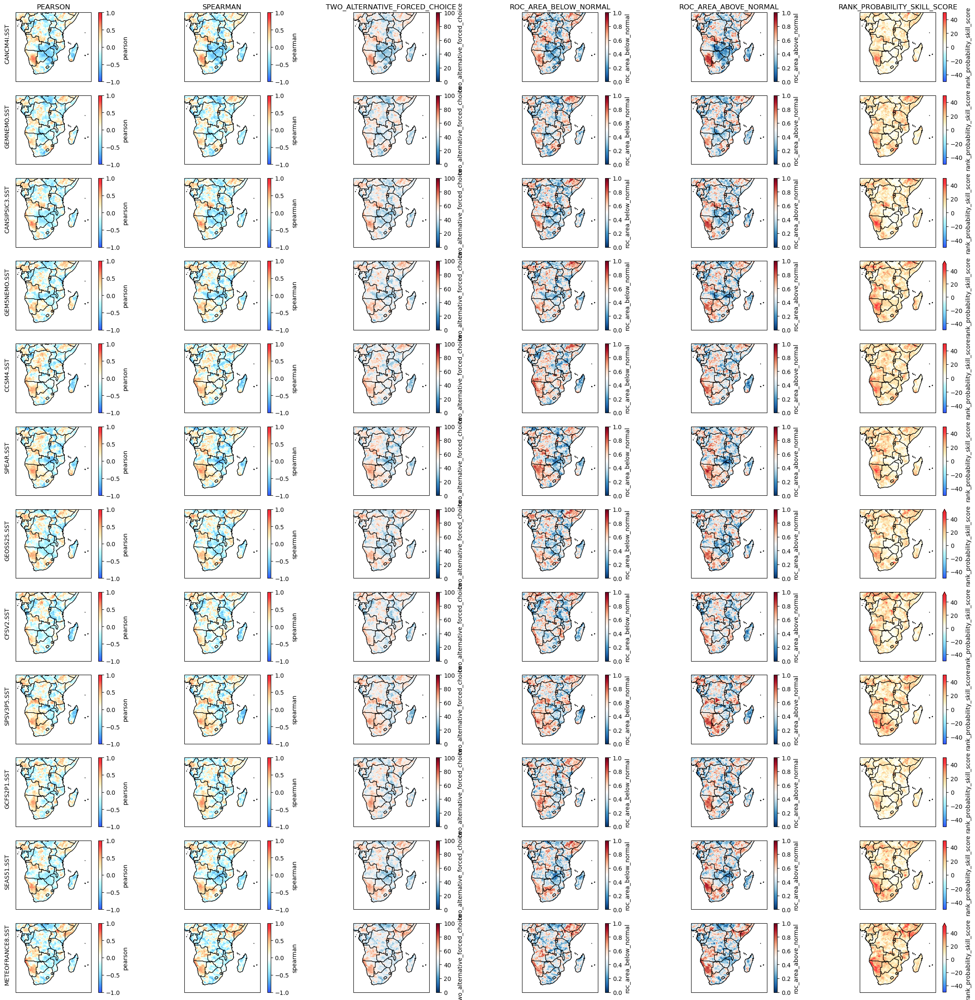

In [21]:
pycpt.plot_skill(predictor_names, skill, MOS, domain_dir, skill_metrics)

#### Plot EOF Modes

CANCM4I.SST - MODE 1


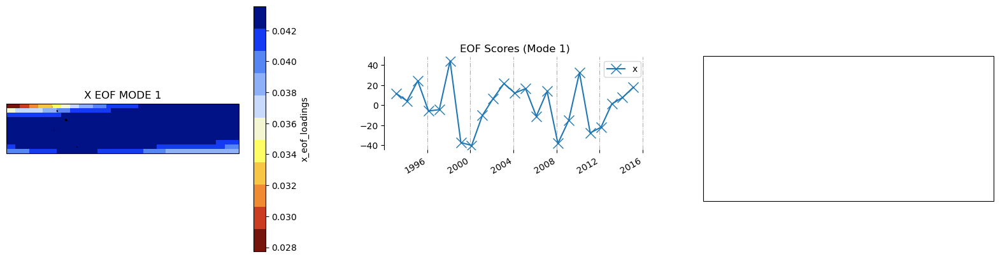

CANCM4I.SST - MODE 2


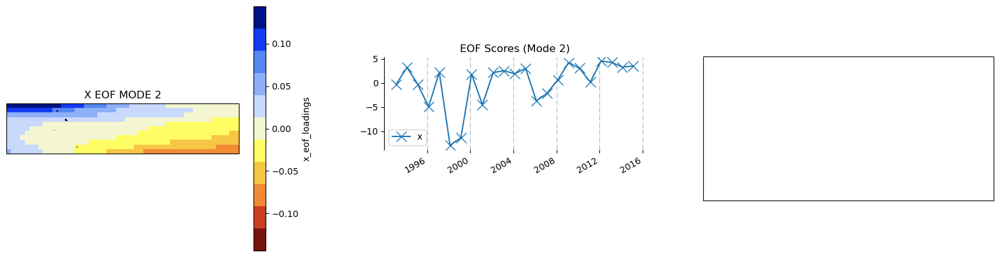

CANCM4I.SST - MODE 3


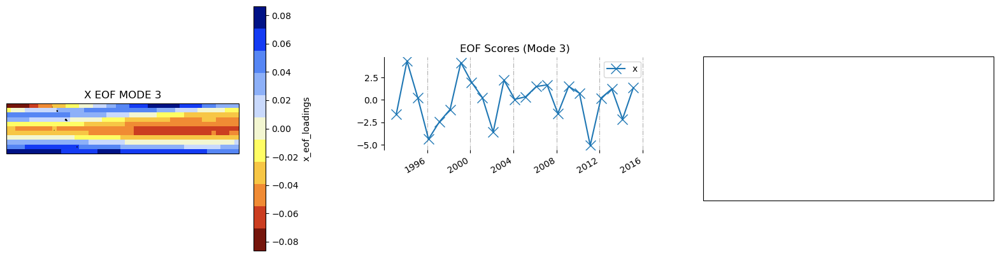

CANCM4I.SST - MODE 4


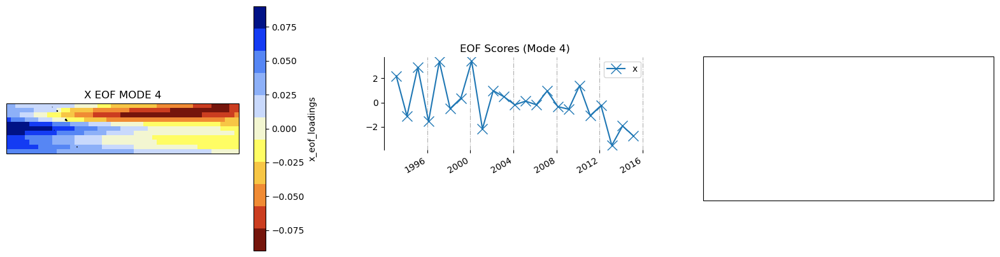

CANCM4I.SST - MODE 5


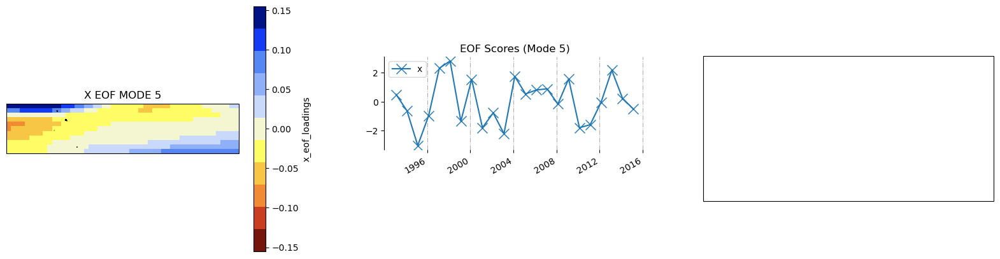

GEMNEMO.SST - MODE 1


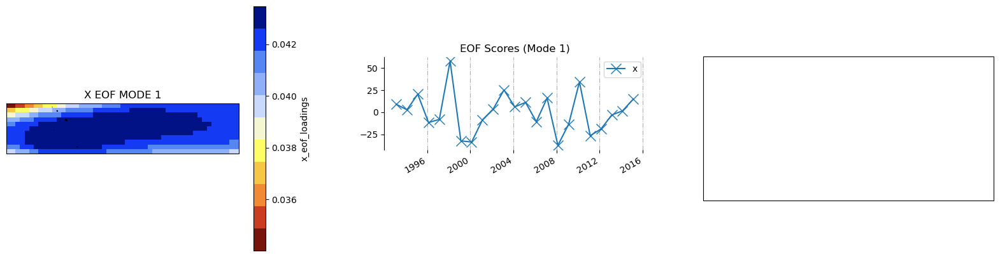

GEMNEMO.SST - MODE 2


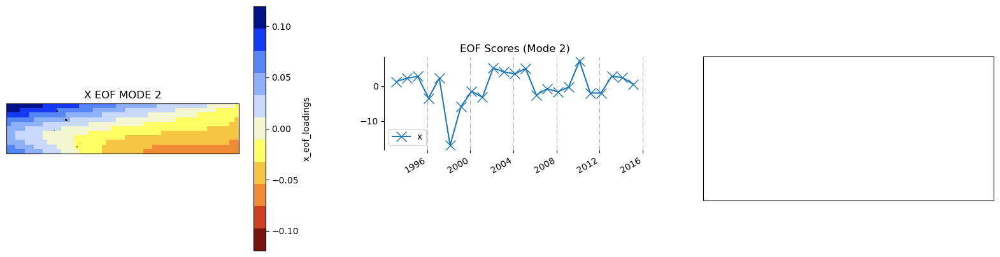

GEMNEMO.SST - MODE 3


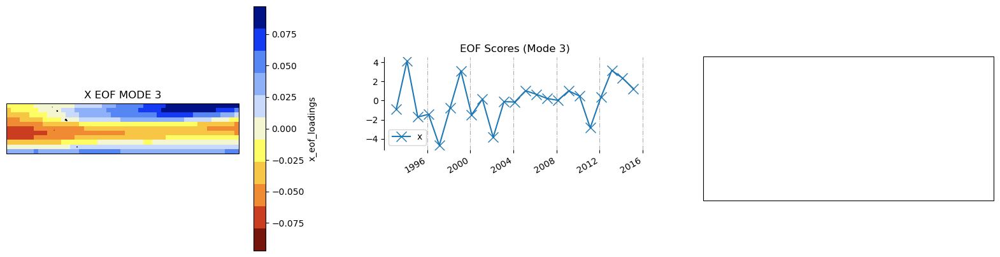

GEMNEMO.SST - MODE 4


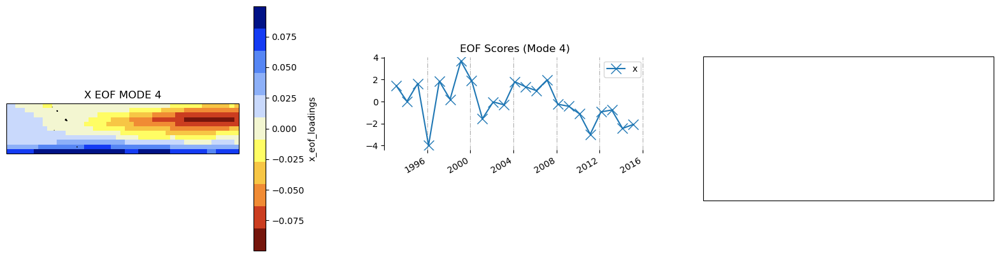

GEMNEMO.SST - MODE 5


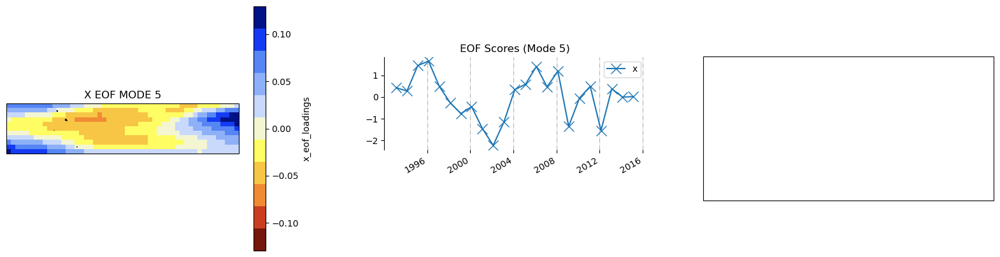

CANSIPSIC3.SST - MODE 1


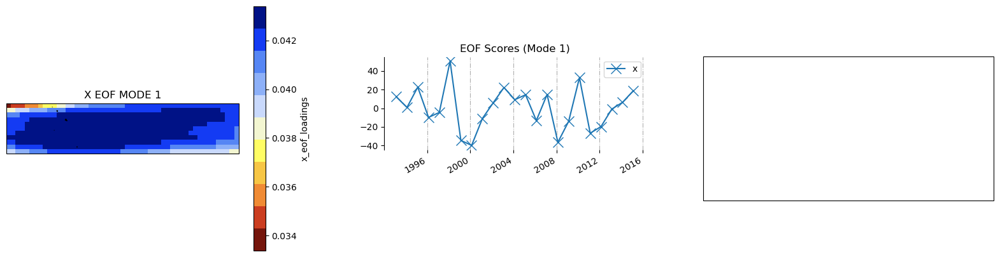

CANSIPSIC3.SST - MODE 2


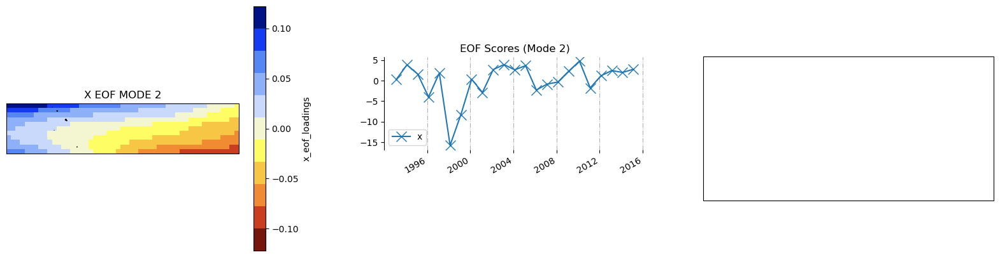

CANSIPSIC3.SST - MODE 3


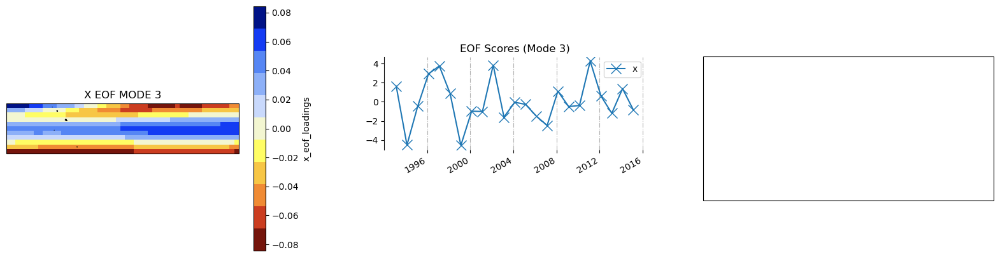

CANSIPSIC3.SST - MODE 4


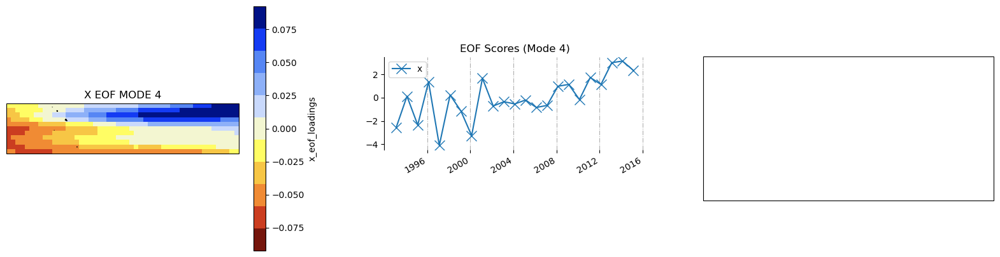

CANSIPSIC3.SST - MODE 5


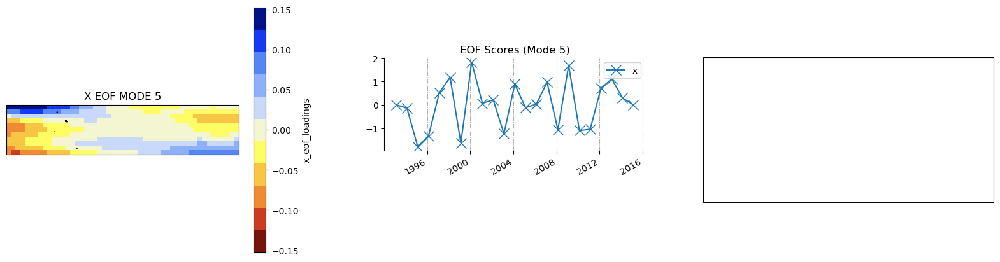

GEM5NEMO.SST - MODE 1


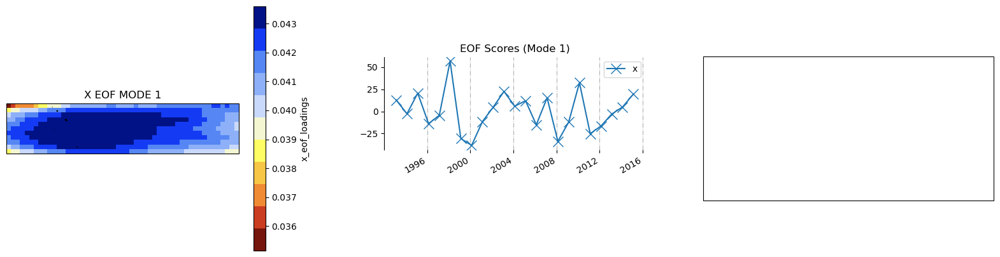

GEM5NEMO.SST - MODE 2


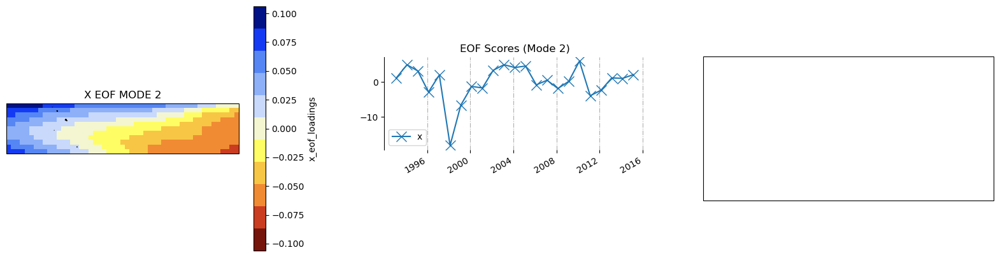

GEM5NEMO.SST - MODE 3


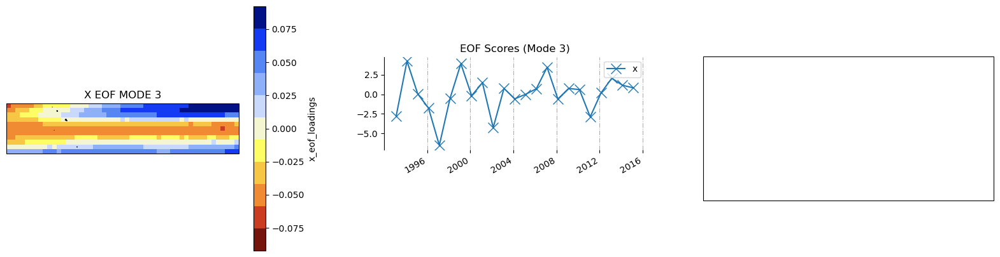

GEM5NEMO.SST - MODE 4


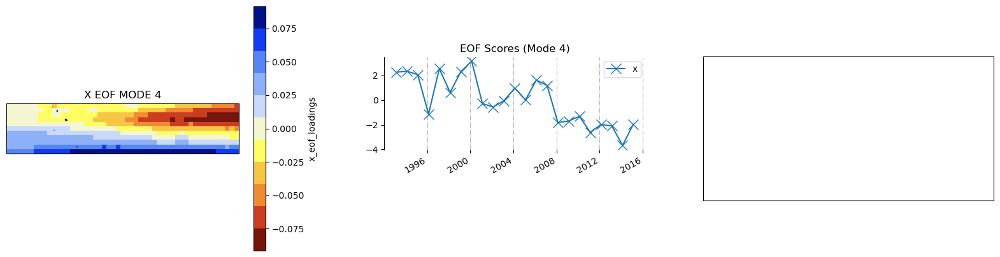

GEM5NEMO.SST - MODE 5


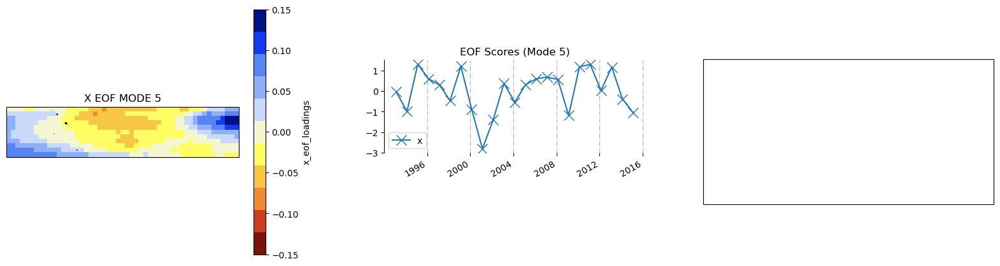

CCSM4.SST - MODE 1


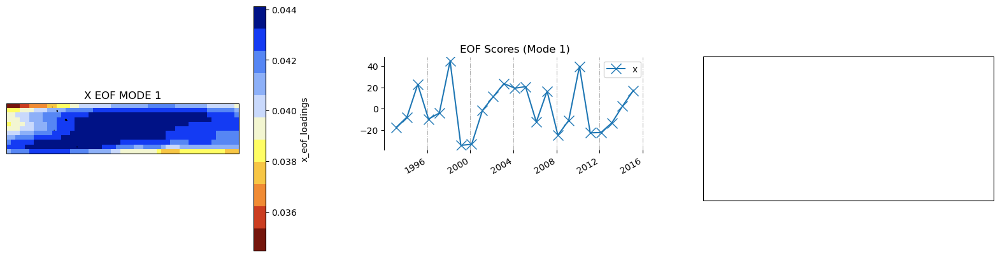

CCSM4.SST - MODE 2


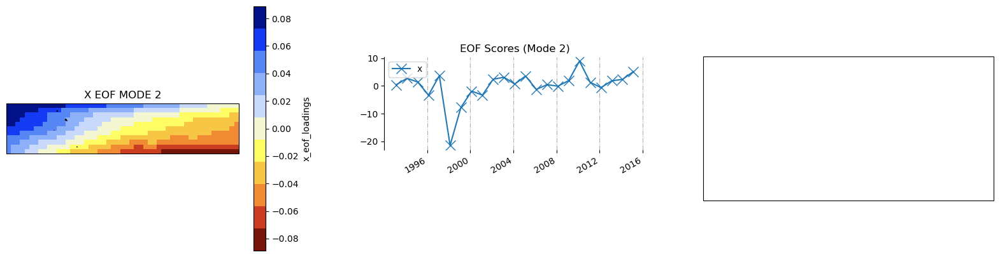

CCSM4.SST - MODE 3


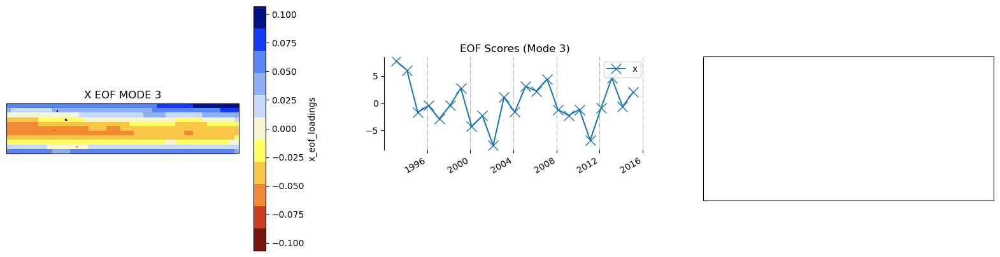

CCSM4.SST - MODE 4


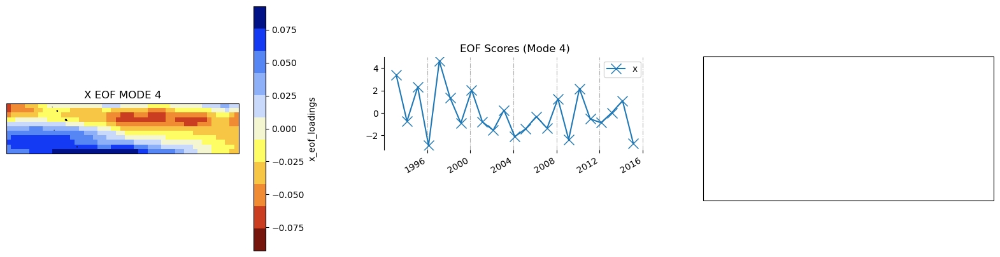

CCSM4.SST - MODE 5


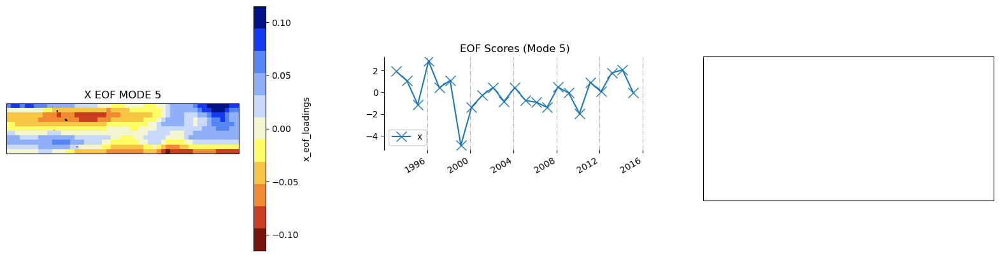

SPEAR.SST - MODE 1


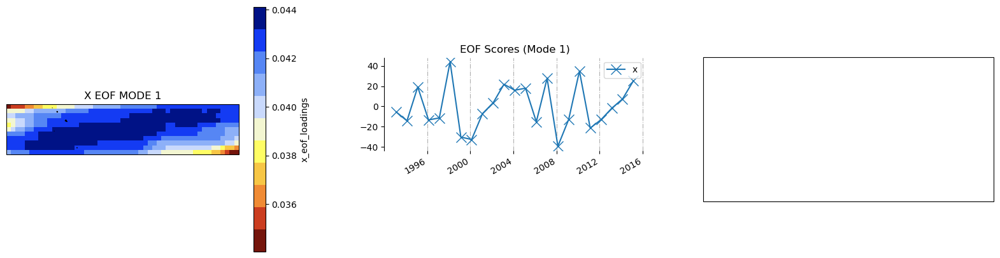

SPEAR.SST - MODE 2


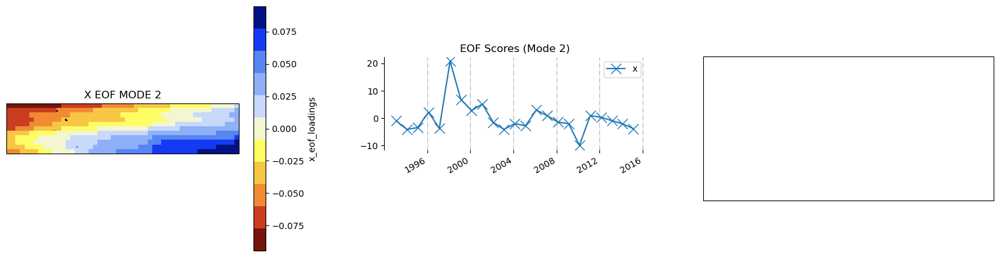

SPEAR.SST - MODE 3


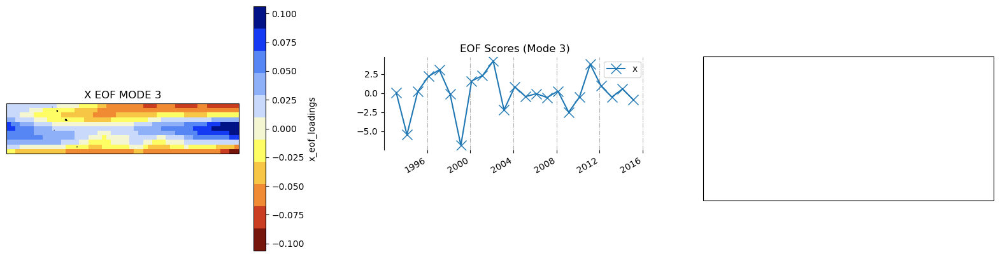

SPEAR.SST - MODE 4


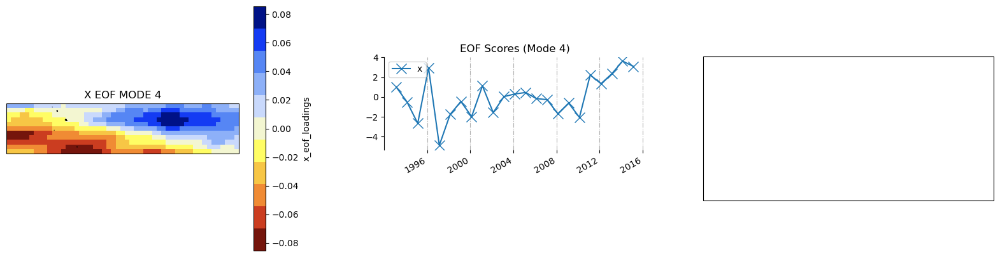

SPEAR.SST - MODE 5


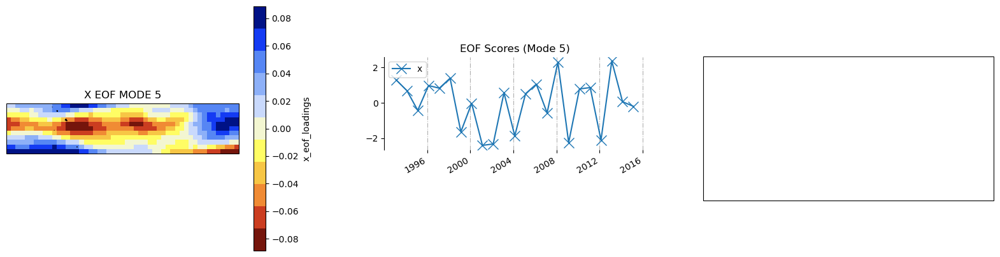

GEOSS2S.SST - MODE 1


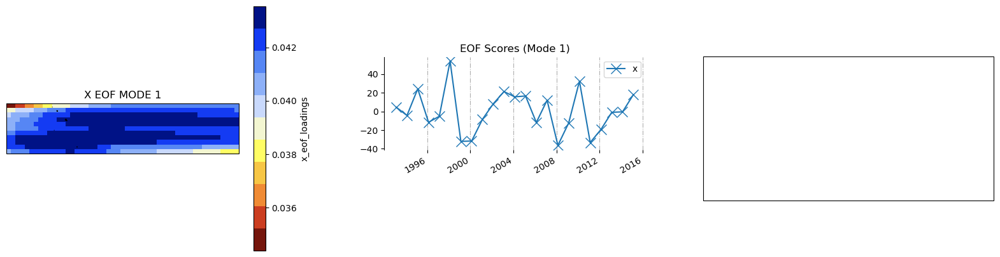

GEOSS2S.SST - MODE 2


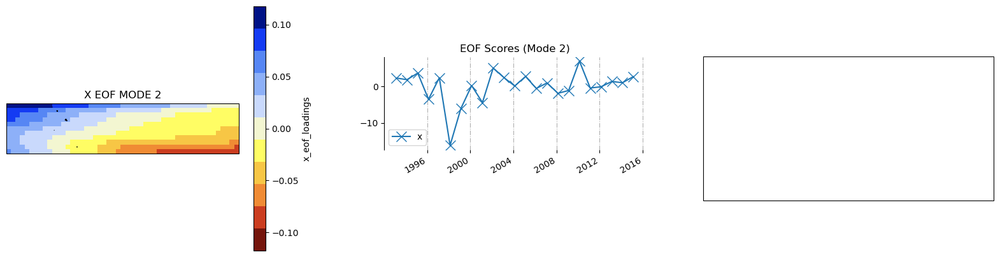

GEOSS2S.SST - MODE 3


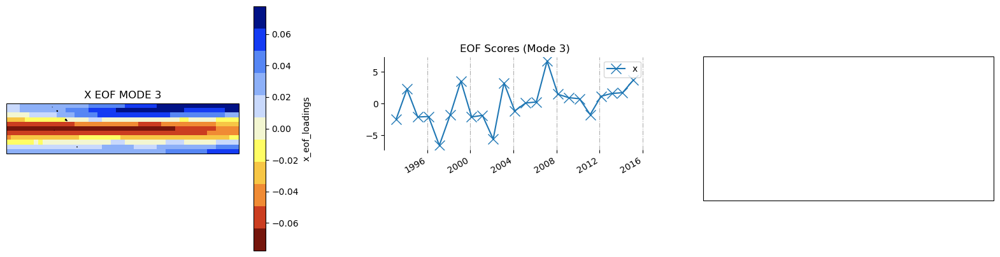

GEOSS2S.SST - MODE 4


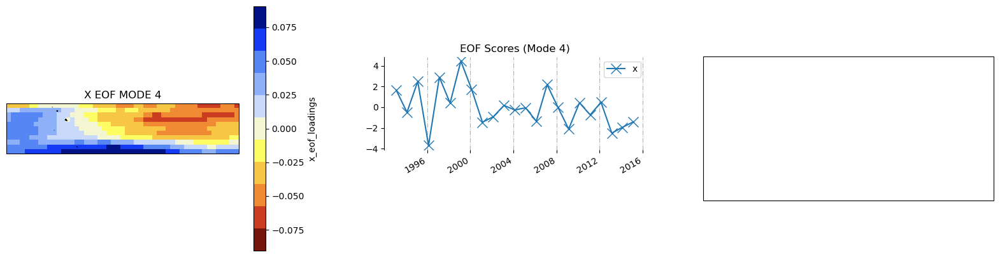

GEOSS2S.SST - MODE 5


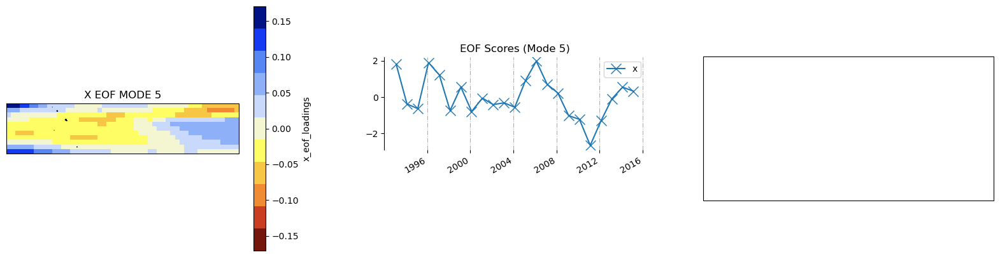

CFSV2.SST - MODE 1


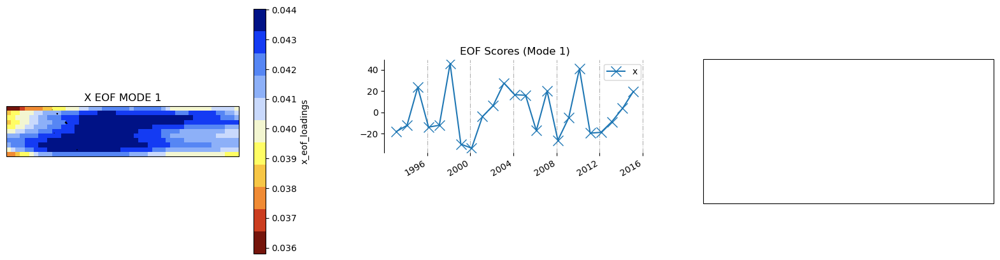

CFSV2.SST - MODE 2


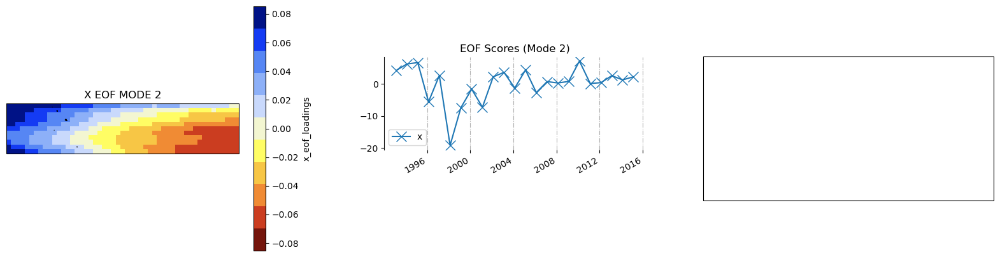

CFSV2.SST - MODE 3


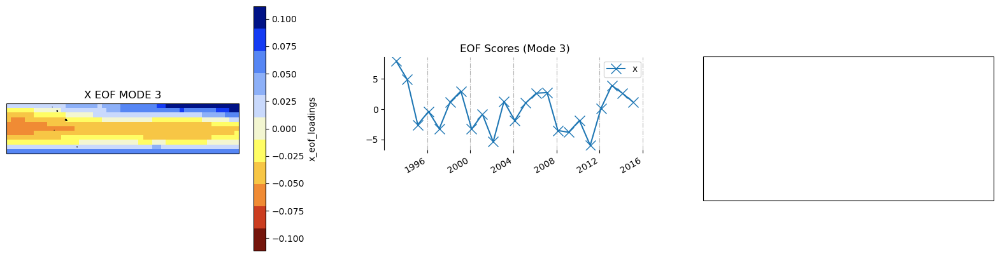

CFSV2.SST - MODE 4


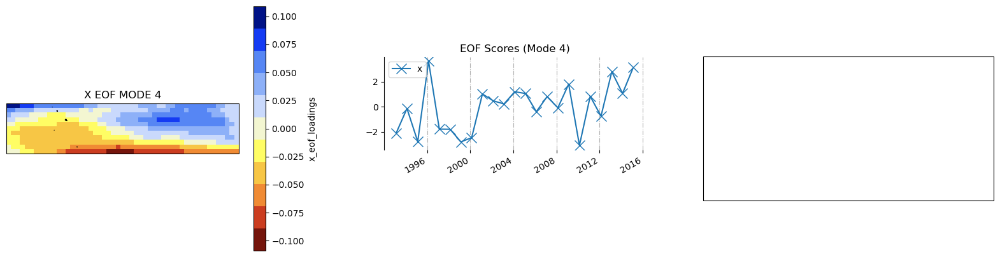

CFSV2.SST - MODE 5


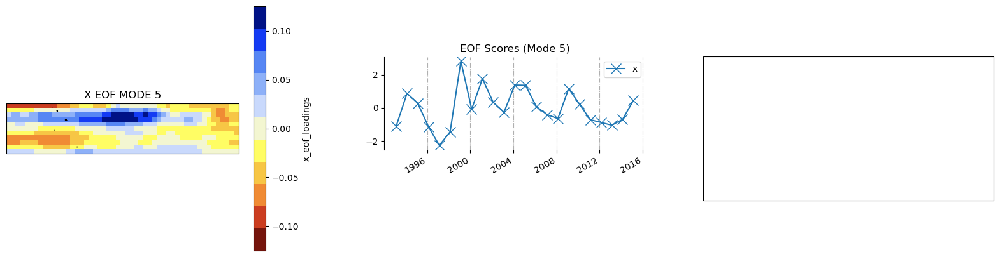

SPSV3P5.SST - MODE 1


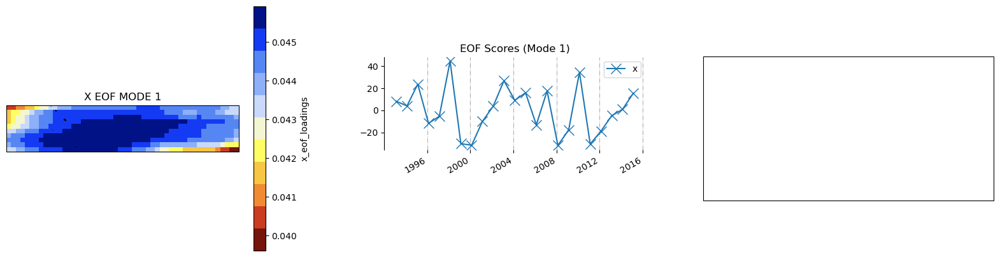

SPSV3P5.SST - MODE 2


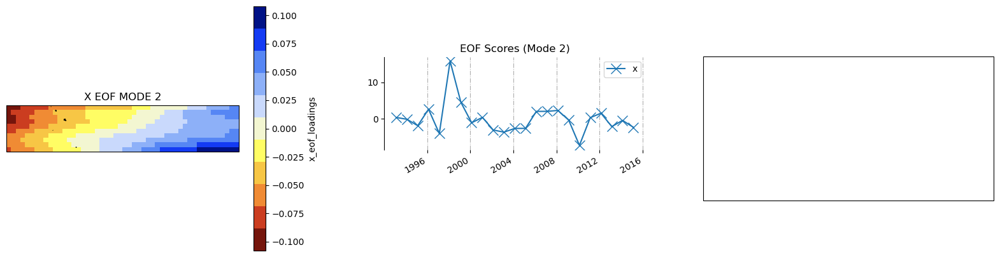

SPSV3P5.SST - MODE 3


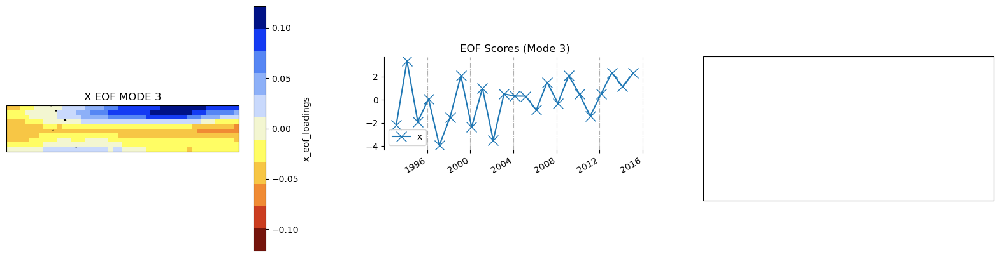

SPSV3P5.SST - MODE 4


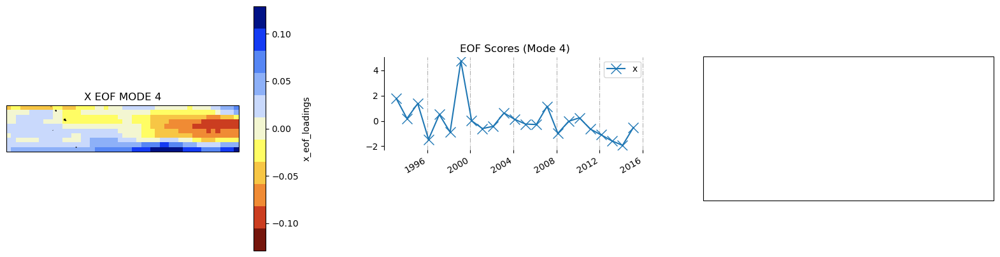

SPSV3P5.SST - MODE 5


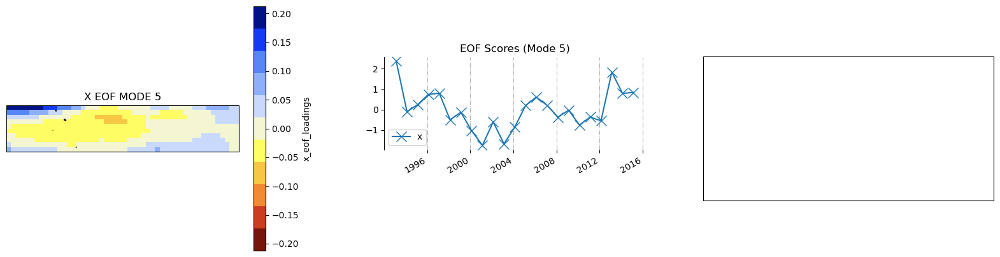

GCFS2P1.SST - MODE 1


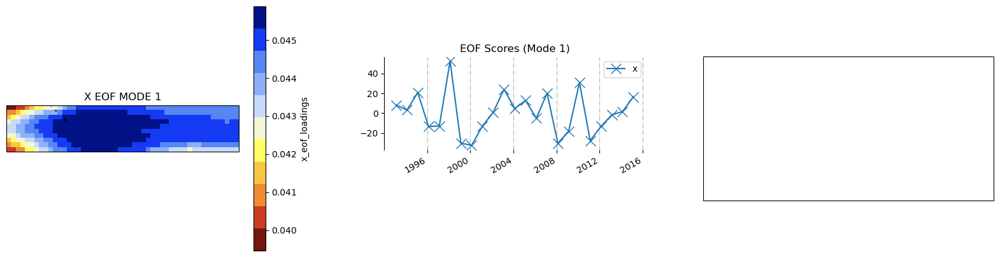

GCFS2P1.SST - MODE 2


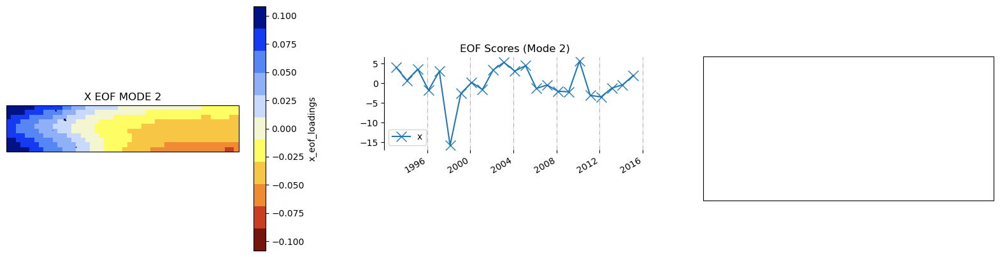

GCFS2P1.SST - MODE 3


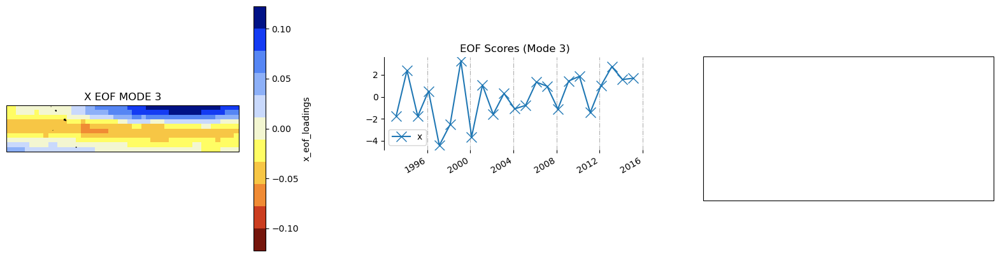

GCFS2P1.SST - MODE 4


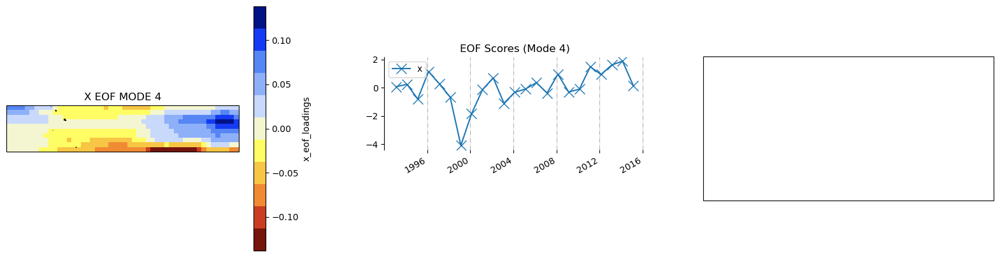

GCFS2P1.SST - MODE 5


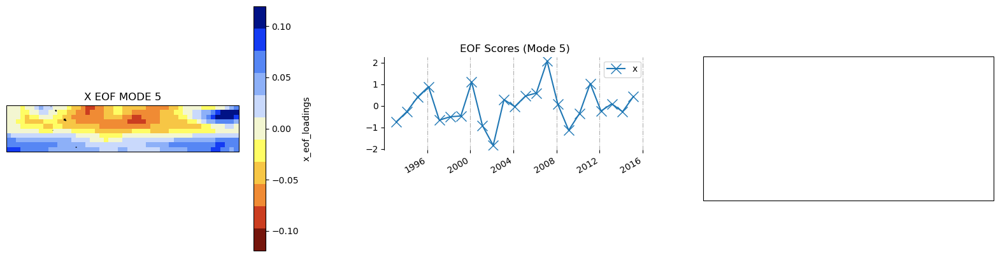

SEAS51.SST - MODE 1


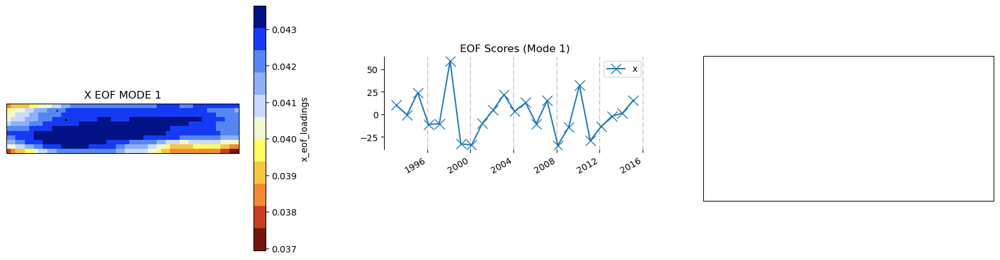

SEAS51.SST - MODE 2


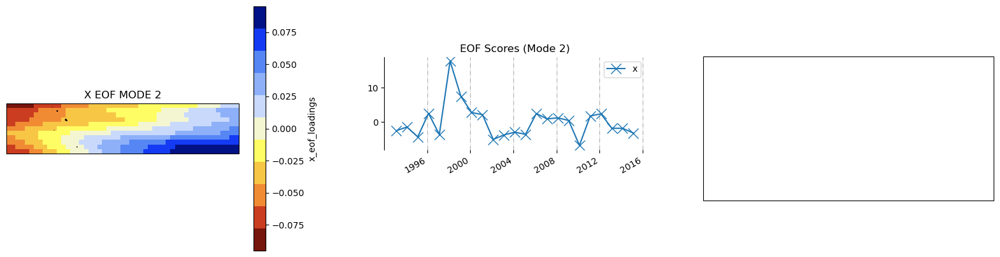

SEAS51.SST - MODE 3


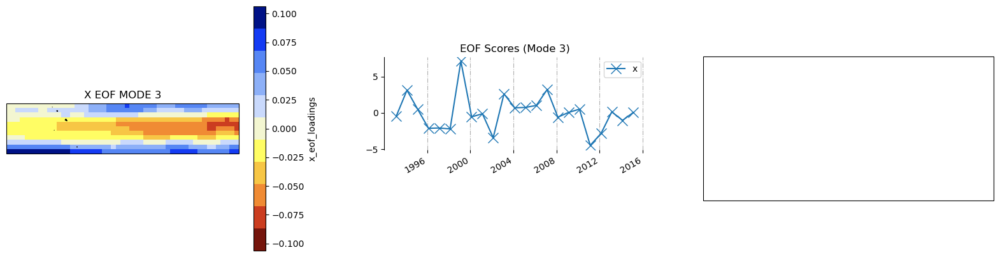

SEAS51.SST - MODE 4


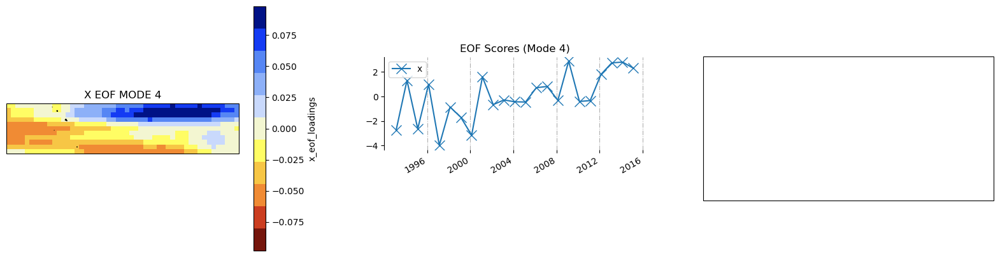

SEAS51.SST - MODE 5


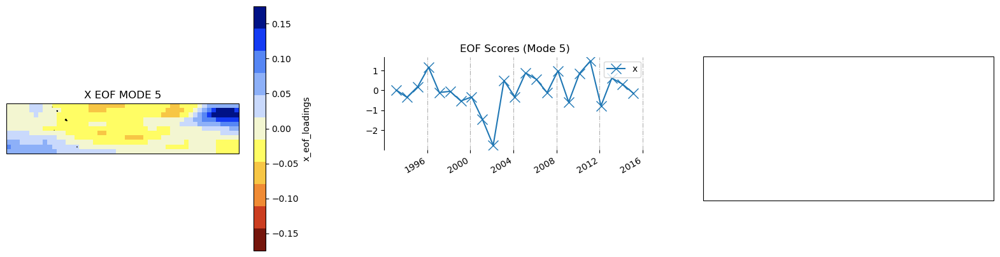

METEOFRANCE8.SST - MODE 1


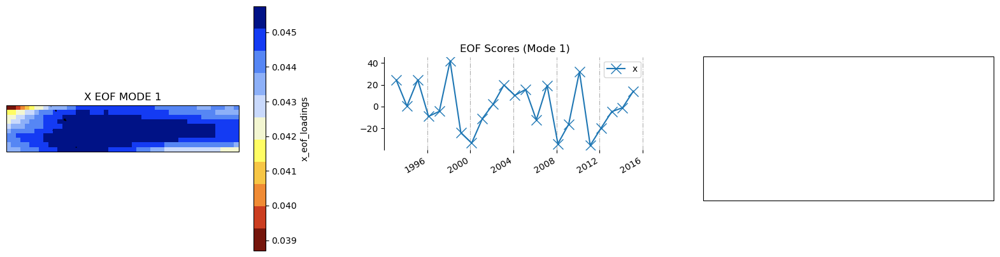

METEOFRANCE8.SST - MODE 2


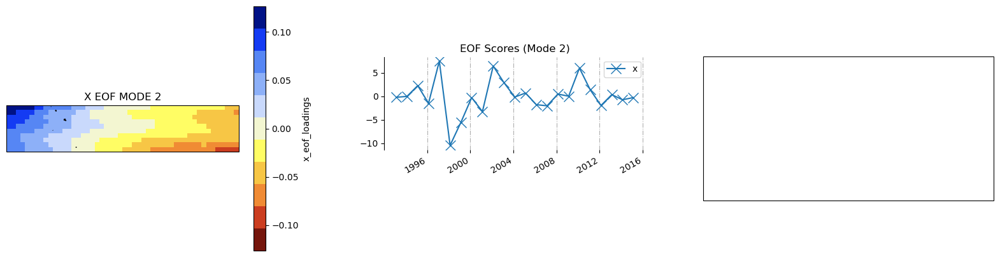

METEOFRANCE8.SST - MODE 3


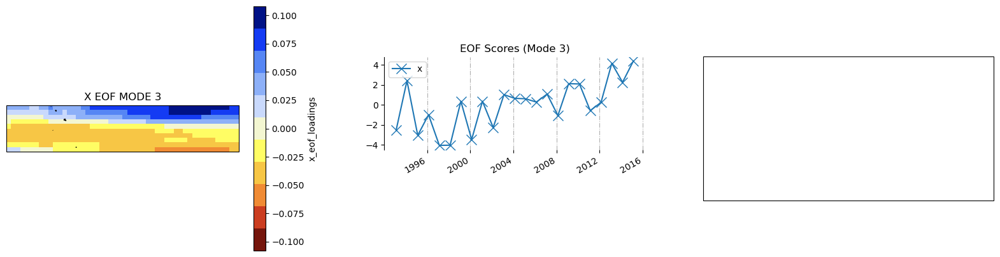

METEOFRANCE8.SST - MODE 4


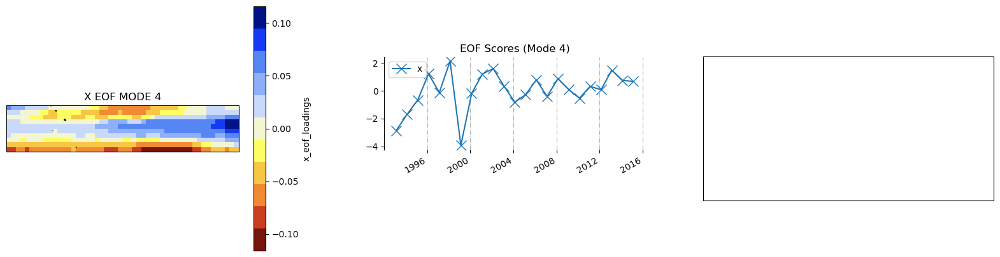

METEOFRANCE8.SST - MODE 5


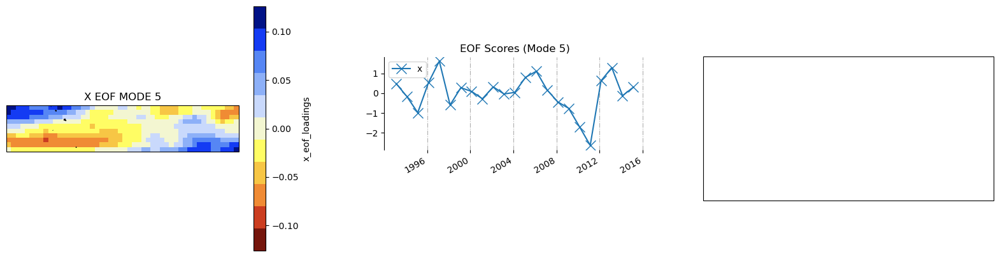

In [22]:
pycpt.plot_eof_modes(MOS, predictor_names, pxs, pys, domain_dir)

#### Plot CCA Modes

In [23]:
pycpt.plot_cca_modes(MOS, predictor_names, pxs, pys, domain_dir)

You will need to set MOS=CCA in order to see CCA Modes


#### Plot Forecasts

/home/tnkemelang/.local/lib/python3.10/site-packages/xarray/plot/utils.py:457: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  _, ax = plt.subplots(figsize=figsize, subplot_kw=subplot_kws)
/home/tnkemelang/miniconda3/envs/pycpt_env/lib/python3.10/site-packages/pycpt/notebook.py:654: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(18, 10), facecolor="w", dpi=my_dpi)


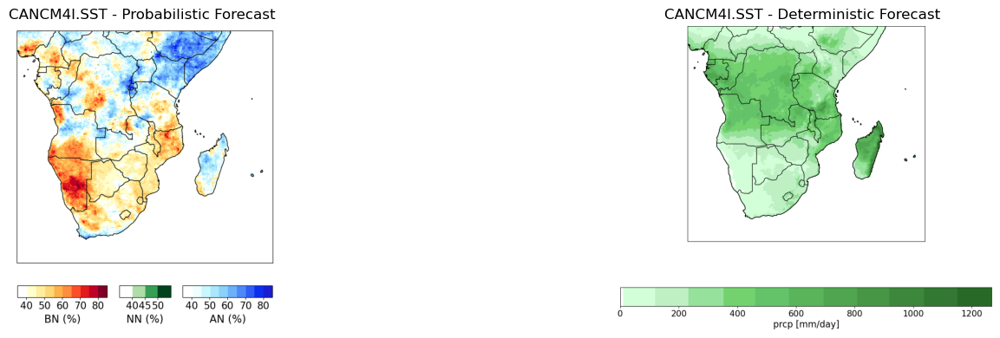

<Figure size 700x900 with 0 Axes>

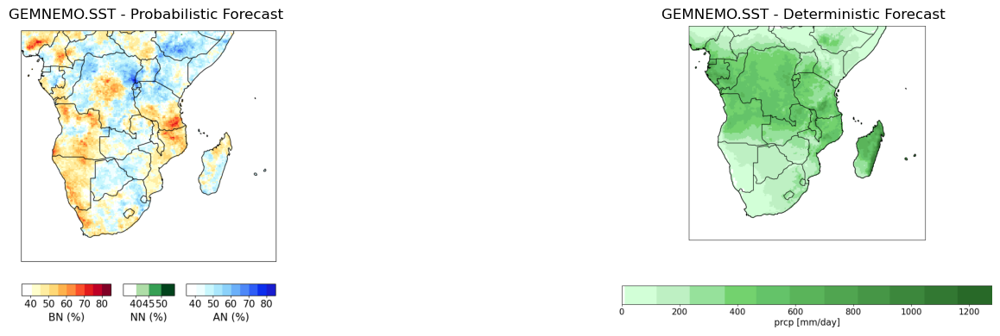

<Figure size 700x900 with 0 Axes>

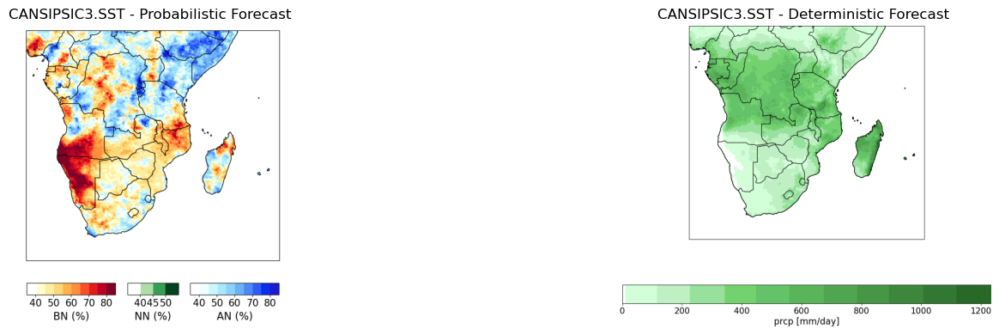

<Figure size 700x900 with 0 Axes>

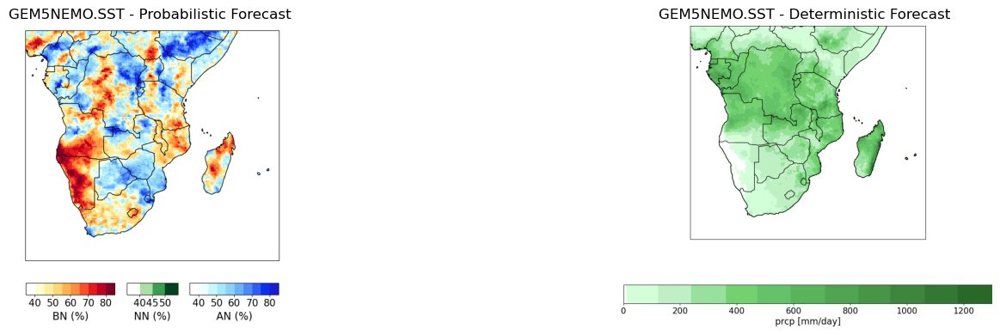

<Figure size 700x900 with 0 Axes>

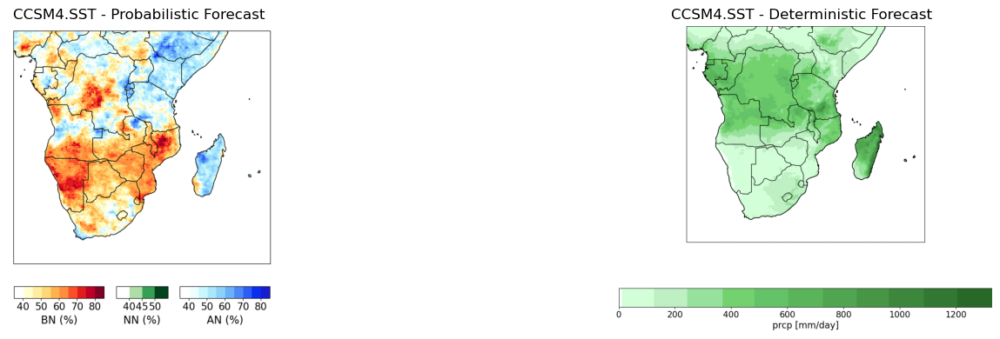

<Figure size 700x900 with 0 Axes>

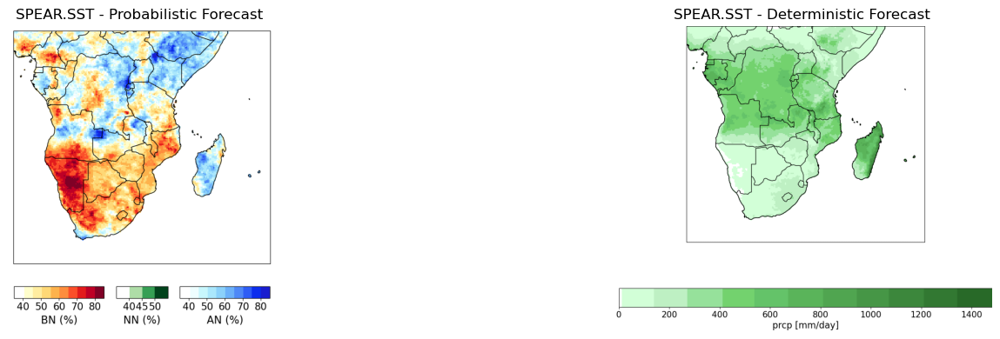

<Figure size 700x900 with 0 Axes>

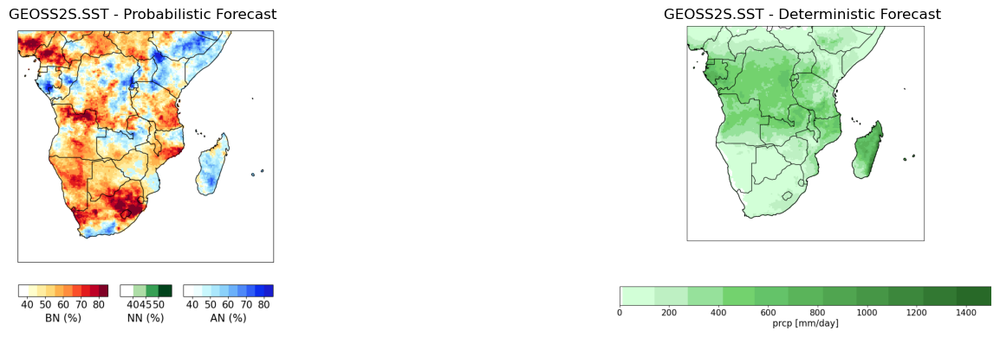

<Figure size 700x900 with 0 Axes>

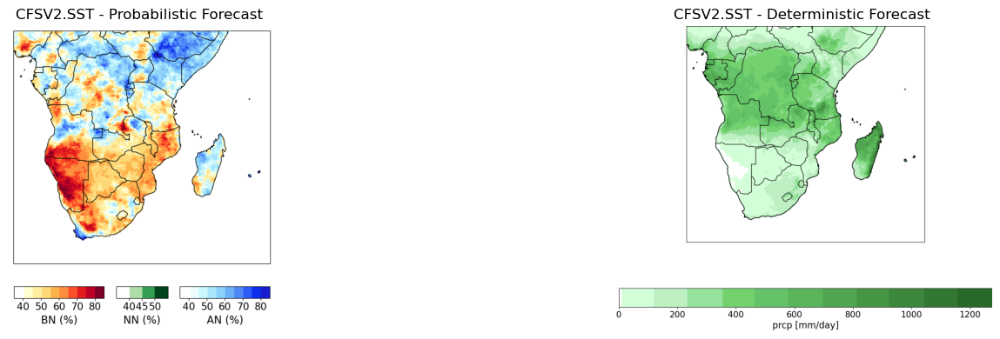

<Figure size 700x900 with 0 Axes>

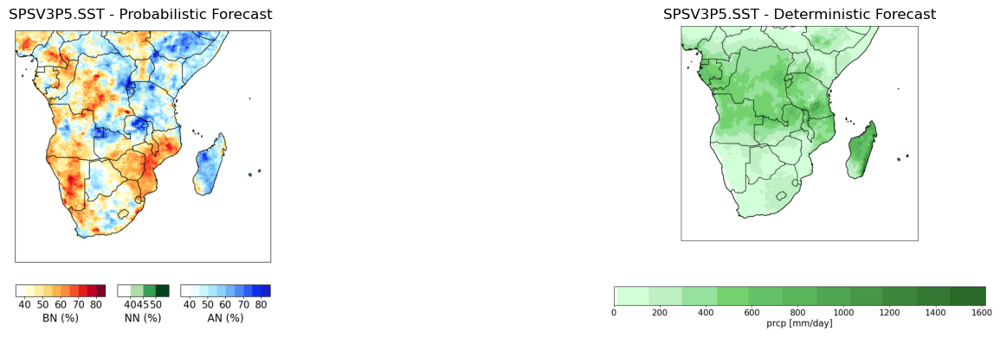

<Figure size 700x900 with 0 Axes>

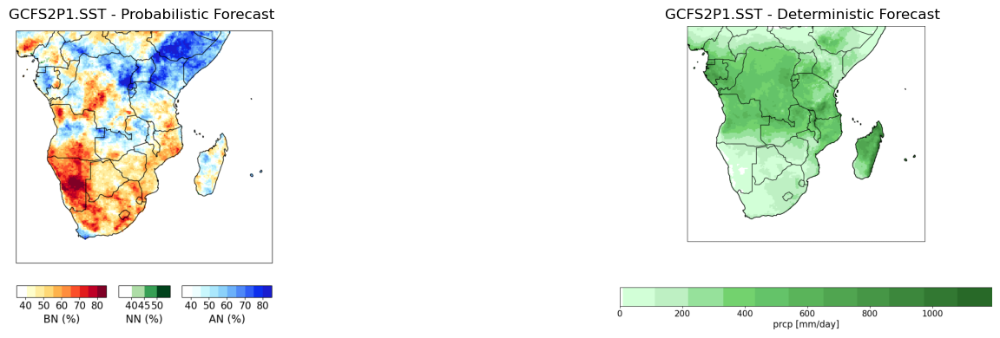

<Figure size 700x900 with 0 Axes>

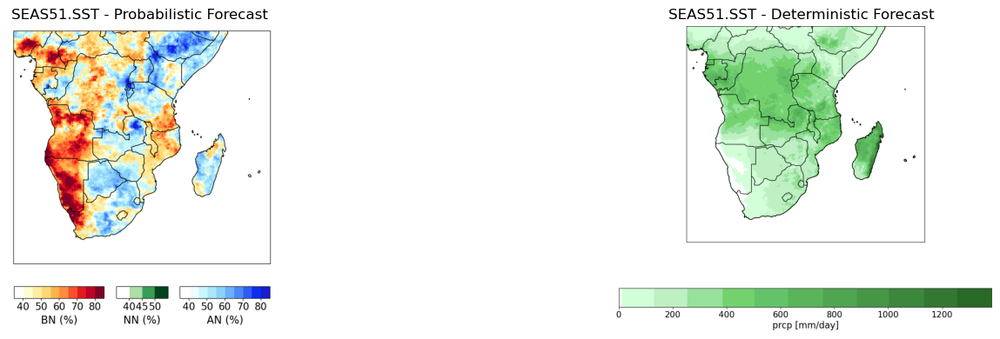

<Figure size 700x900 with 0 Axes>

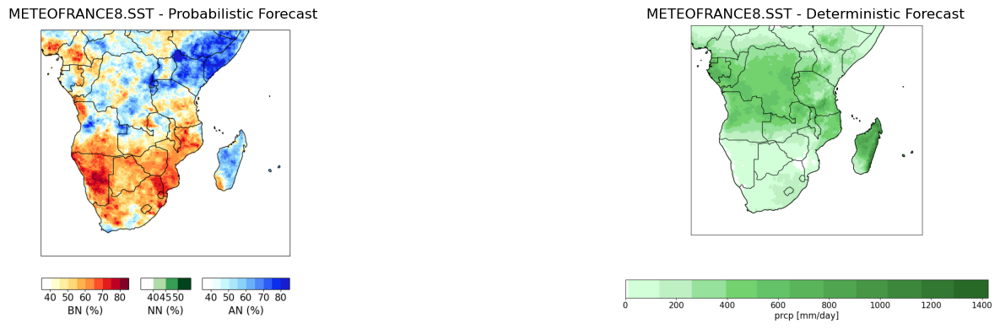

<Figure size 700x900 with 0 Axes>

In [24]:
pycpt.plot_forecasts(cpt_args, predictand_name, fcsts, domain_dir, predictor_names, MOS)

In [25]:
# Masking based on skill
import glob
import os
data_dir = str(case_dir)+ '/output/'

processed_dir = data_dir + 'processed'
if os.path.exists(processed_dir):
    print('Path already exists')
else:
    os.mkdir(processed_dir)

#skill_scores = glob.glob(data_dir+ '*_skillscores_*')

forecasts = glob.glob(data_dir+ '*forecasts*')
hindcasts = glob.glob(data_dir+ '*_crossvalidated*hindcasts*')

In [26]:
if os.path.exists(data_dir + '../figures/by_model'):
    print('Path already exists')
else:
    os.mkdir(data_dir + '../figures/by_model')

if os.path.exists(data_dir + '../figures/by_skill'):
    print('Path already exists')
else:
    os.mkdir(data_dir + '../figures/by_skill')

pearson
spearman
two_alternative_forced_choice
roc_area_below_normal
roc_area_above_normal
rank_probability_skill_score


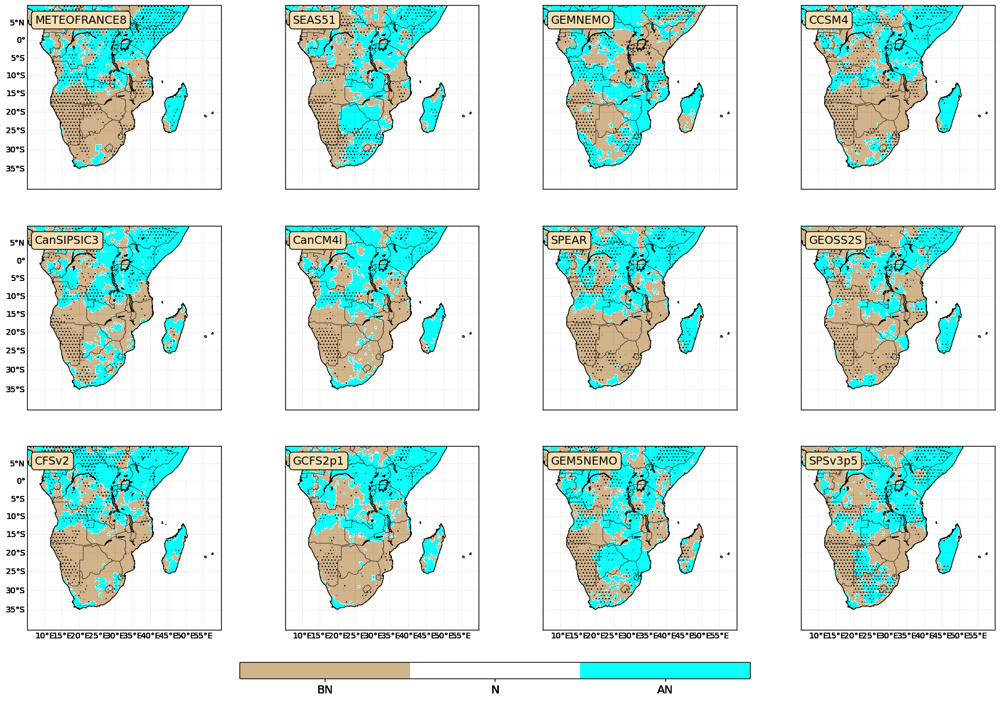

In [27]:
import functions_py
    
n_datasets = len(forecasts)
fig_format = functions_py.fig_format(n_datasets)
fig = fig_format[0]
fig_array = fig_format[1]
label_parallels = fig_format[2]
label_meridians = fig_format[3]
for skill in skill_metrics:
    skill_score_to_mask = skill
    i=0
    print(skill)
    for model in forecasts:
        i = i+1
        ax = fig.add_subplot(fig_array[0], fig_array[1], i)
        model_name = model.split('/')[-1].split('.')[0]
        skill_scores_file = data_dir +  model_name +'.' + predictor_var + '_skillscores_' + mos_lc +'.nc'
        forecast = xr.open_dataset(model)#.deterministic
        skill_scores = xr.open_dataset(skill_scores_file)
    
        skill_score_1 = skill_scores[skill_score_to_mask]
        if skill_score_to_mask in ['pearson', 'spearman']:
            #skillful = (skill_score_1.where(skill_score_1 > 0.3)/skill_score_1.where(skill_score_1 > 0.3))
            skillful = skill_score_1.where(skill_score_1 > 0.3,  0).where(skill_score_1 < 0.3,  1)
        elif skill_score_to_mask == 'two_alternative_forced_choice' :
            skillful = skill_score_1.where(skill_score_1 > 60,  0).where(skill_score_1 < 60,  1)
        elif skill_score_to_mask == 'rank_probability_skill_score' :
            skillful = skill_score_1.where(skill_score_1 > 20,  0).where(skill_score_1 < 20,  1)
        elif skill_score_to_mask in ["roc_area_below_normal", "roc_area_above_normal"] :
            skillful = skill_score_1.where(skill_score_1 > 0.6,  0).where(skill_score_1 < 0.6,  1)
            #skillful = (skill_score_1.where(skill_score_1 > 0.6)/skill_score_1.where(skill_score_1 > 0.6))
        else:
            print('Try next time')
        
        below_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[0].drop_vars('C')
        normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[1].drop_vars('C')
        above_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[2].drop_vars('C')
    
        probabilistic_forecast = xr.merge([(below_normal/below_normal)*1, (normal/normal)*2, (above_normal/above_normal)*3])['probabilistic']
        
        lons = probabilistic_forecast['X'][:]
        lats = probabilistic_forecast['Y'][:]
        
        map = Basemap ( projection ='mill',llcrnrlon=np.min(lons).values,urcrnrlon=np.max(lons).values, 
                       llcrnrlat=np.min(lats).values,urcrnrlat=np.max(lats).values,resolution='l')
        x2d, y2d = map(*np.meshgrid(lons,lats))
        levs = np.arange(0.5,4,1) 
        hatches = [None, '...']
        levs_pval = np.arange(-1,2, 1)
        ticklabels=['BN', 'N', 'AN']
        #levs = np.array([1,2,3,4,])*5/4 - 0.6
       
        cmap=colors.ListedColormap([ '#d2b48c', 'white','#0bfffb']) # colormap for tercile forecast
        pl1 = map.contourf(x2d,y2d,probabilistic_forecast[0,:,:],levs,cmap=cmap, vmin = 0, vmax = 4)
        ab2 = map.contourf(x2d,y2d,skillful[:,:],levs_pval,hatches=hatches, colors = 'none')
        map.drawcoastlines()
        map.drawcountries()   
       
        map.drawparallels(np.arange(-80., 81., 5), \
            labels=label_parallels[i-1], fontsize=10,linewidth=0.1)
        map.drawmeridians(np.arange(-180., 181., 5),\
            labels=label_meridians[i-1], fontsize=10,linewidth=0.1)
    
        props = dict(boxstyle='round', facecolor='wheat', alpha=1)
        ax.text(0.04, 0.95, model_name, fontsize=14, verticalalignment='top', transform=ax.transAxes, bbox=props)
    
    cax = fig.add_axes([0.3, 0.05, 0.4, 0.02])   
    bar = fig.colorbar(pl1, cax=cax, orientation='horizontal', ticks=[ 1, 2, 3] )
    bar.ax.tick_params(labelsize=14) 
    bar.set_ticklabels(ticklabels)
    plt.savefig(data_dir + '../figures/by_skill/'+skill_score_to_mask+'.png', bbox_inches='tight',dpi=300)

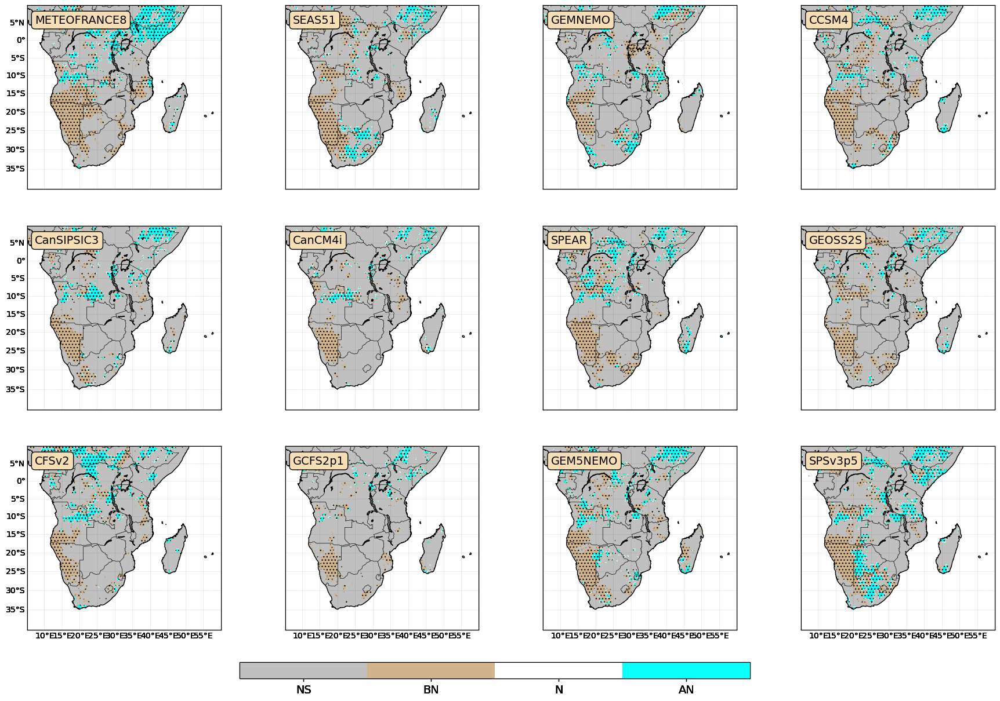

In [28]:
import functions_py
    
n_datasets = len(forecasts)
fig_format = functions_py.fig_format(n_datasets)
fig = fig_format[0]
fig_array = fig_format[1]
label_parallels = fig_format[2]
label_meridians = fig_format[3]
for skill in skill_metrics:
    skill_score_to_mask = skill
    i=0
    for model in forecasts:
        i = i+1
        ax = fig.add_subplot(fig_array[0], fig_array[1], i)
        model_name = model.split('/')[-1].split('.')[0]
        skill_scores_file = data_dir +  model_name +'.' + predictor_var + '_skillscores_' + mos_lc +'.nc'
        forecast = xr.open_dataset(model)#.deterministic
        skill_scores = xr.open_dataset(skill_scores_file)
    
        skill_score_1 = skill_scores[skill_score_to_mask]
        if skill_score_to_mask in ['pearson', 'spearman']:
            #skillful = (skill_score_1.where(skill_score_1 > 0.3)/skill_score_1.where(skill_score_1 > 0.3))
            skillful = skill_score_1.where(skill_score_1 > 0.3,  0).where(skill_score_1 < 0.3,  1)
        elif skill_score_to_mask in [ 'two_alternative_forced_choice' ] :
            skillful = skill_score_1.where(skill_score_1 > 60,  0).where(skill_score_1 < 60,  1)
        elif skill_score_to_mask == 'rank_probability_skill_score' :
            skillful = skill_score_1.where(skill_score_1 > 20,  0).where(skill_score_1 < 20,  1)
        elif skill_score_to_mask in ["roc_area_below_normal", "roc_area_above_normal"] :
            skillful = skill_score_1.where(skill_score_1 > 0.6,  0).where(skill_score_1 < 0.6,  1)
            #skillful = (skill_score_1.where(skill_score_1 > 0.6)/skill_score_1.where(skill_score_1 > 0.6))
        else:
            print('Try next time')
            
        below_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[0].drop_vars('C')
        normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[1].drop_vars('C')
        above_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[2].drop_vars('C')
    
        probabilistic_forecast = xr.merge([(below_normal/below_normal)*1, (normal/normal)*2, (above_normal/above_normal)*3])['probabilistic']
        
        lons = probabilistic_forecast['X'][:]
        lats = probabilistic_forecast['Y'][:]
        
        map = Basemap ( projection ='mill',llcrnrlon=np.min(lons).values,urcrnrlon=np.max(lons).values, 
                       llcrnrlat=np.min(lats).values,urcrnrlat=np.max(lats).values,resolution='l')
        x2d, y2d = map(*np.meshgrid(lons,lats))
        levs = np.arange(-0.5,4,1) 
        hatches = [None, '...']
        levs_pval = np.arange(-1,2, 1)
        ticklabels=['NS','BN', 'N', 'AN']
        #levs = np.array([1,2,3,4,])*5/4 - 0.6
       
        cmap=colors.ListedColormap(['silver', '#d2b48c', 'white','#0bfffb']) # colormap for tercile forecast
        pl1 = map.contourf(x2d,y2d,probabilistic_forecast[0,:,:]*skillful,levs,cmap=cmap, vmin = 0, vmax = 4)
        ab2 = map.contourf(x2d,y2d,skillful[:,:],levs_pval,hatches=hatches, colors = 'none')
        map.drawcoastlines()
        map.drawcountries()   
       
        map.drawparallels(np.arange(-80., 81., 5), \
            labels=label_parallels[i-1], fontsize=10,linewidth=0.1)
        map.drawmeridians(np.arange(-180., 181., 5),\
            labels=label_meridians[i-1], fontsize=10,linewidth=0.1)
    
        props = dict(boxstyle='round', facecolor='wheat', alpha=1)
        ax.text(0.04, 0.95, model_name, fontsize=14, verticalalignment='top', transform=ax.transAxes, bbox=props)
    
    cax = fig.add_axes([0.3, 0.05, 0.4, 0.02])   
    bar = fig.colorbar(pl1, cax=cax, orientation='horizontal', ticks=[0, 1, 2, 3] )
    bar.ax.tick_params(labelsize=14) 
    bar.set_ticklabels(ticklabels)
    plt.savefig(data_dir + '../figures/by_skill/'+skill_score_to_mask+'_masked.png', bbox_inches='tight',dpi=300)

Text(0.04, 0.95, 'CCSM4')

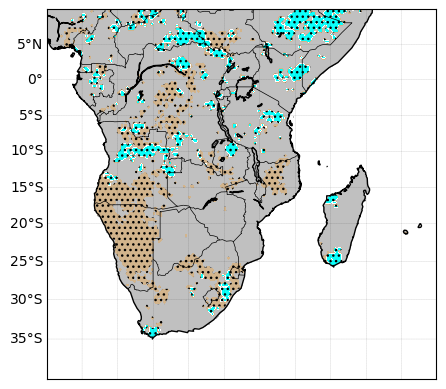

In [29]:
model_name = 'CCSM4'
skill_score_to_mask = 'rank_probability_skill_score'
i=1

ax = fig.add_subplot(fig_array[0], fig_array[1], i) #CCSM4.PRCP_realtime_pcr_forecasts.nc
model = data_dir +  model_name +'.' + predictor_var + '_realtime_' + mos_lc +'_forecasts.nc'
model_name = model.split('/')[-1].split('.')[0]
skill_scores_file = data_dir +  model_name +'.' + predictor_var + '_skillscores_' + mos_lc +'.nc'
forecast = xr.open_dataset(model)#.deterministic
skill_scores = xr.open_dataset(skill_scores_file)

skill_score_1 = skill_scores[skill_score_to_mask]
if skill_score_to_mask in ['pearson', 'spearman']:
    #skillful = (skill_score_1.where(skill_score_1 > 0.3)/skill_score_1.where(skill_score_1 > 0.3))
    skillful = skill_score_1.where(skill_score_1 > 0.3,  0).where(skill_score_1 < 0.3,  1)
elif skill_score_to_mask in ['two_alternative_forced_choice'] :
    skillful = skill_score_1.where(skill_score_1 > 60,  0).where(skill_score_1 < 60,  1)
elif skill_score_to_mask == 'rank_probability_skill_score' :
            skillful = skill_score_1.where(skill_score_1 > 20,  0).where(skill_score_1 < 20,  1)
elif skill_score_to_mask in ["roc_area_below_normal", "roc_area_above_normal"] :
    skillful = skill_score_1.where(skill_score_1 > 0.6,  0).where(skill_score_1 < 0.6,  1)
    #skillful = (skill_score_1.where(skill_score_1 > 0.6)/skill_score_1.where(skill_score_1 > 0.6))
else:
    print('Try next time')

below_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[0].drop_vars('C')
normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[1].drop_vars('C')
above_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[2].drop_vars('C')

probabilistic_forecast = xr.merge([(below_normal/below_normal)*1, (normal/normal)*2, (above_normal/above_normal)*3])['probabilistic']

lons = probabilistic_forecast['X'][:]
lats = probabilistic_forecast['Y'][:]

map = Basemap ( projection ='mill',llcrnrlon=np.min(lons).values,urcrnrlon=np.max(lons).values, 
               llcrnrlat=np.min(lats).values,urcrnrlat=np.max(lats).values,resolution='l')
x2d, y2d = map(*np.meshgrid(lons,lats))
levs = np.arange(-0.5,4,1) 
hatches = [None, '...']
levs_pval = np.arange(-1,2, 1)
ticklabels=['NS','BN', 'N', 'AN']
#levs = np.array([1,2,3,4,])*5/4 - 0.6

cmap=colors.ListedColormap(['silver', '#d2b48c', 'white','#0bfffb']) # colormap for tercile forecast
pl1 = map.contourf(x2d,y2d,probabilistic_forecast[0,:,:]*skillful,levs,cmap=cmap, vmin = 0, vmax = 4)
ab2 = map.contourf(x2d,y2d,skillful[:,:],levs_pval,hatches=hatches, colors = 'none')
map.drawcoastlines()
map.drawcountries()   

map.drawparallels(np.arange(-80., 81., 5), \
    labels=label_parallels[i-1], fontsize=10,linewidth=0.1)
map.drawmeridians(np.arange(-180., 181., 5),\
    labels=label_meridians[i-1], fontsize=10,linewidth=0.1)

props = dict(boxstyle='round', facecolor='wheat', alpha=1)
ax.text(0.04, 0.95, model_name, fontsize=14, verticalalignment='top', transform=ax.transAxes, bbox=props)

In [30]:
skill_scores

<xarray.Dataset>
Dimensions:                        (Y: 200, X: 220)
Coordinates:
  * Y                              (Y) float64 9.875 9.625 ... -39.62 -39.88
  * X                              (X) float64 5.125 5.375 5.625 ... 59.62 59.88
Data variables:
    pearson                        (Y, X) float64 ...
    spearman                       (Y, X) float64 ...
    two_alternative_forced_choice  (Y, X) float64 ...
    roc_area_below_normal          (Y, X) float64 ...
    roc_area_above_normal          (Y, X) float64 ...
    generalized_roc                (Y, X) float64 ...
    ignorance                      (Y, X) float64 ...
    rank_probability_skill_score   (Y, X) float64 7.744 0.5131 ... -999.0 -999.0

<Figure size 2200x1400 with 0 Axes>

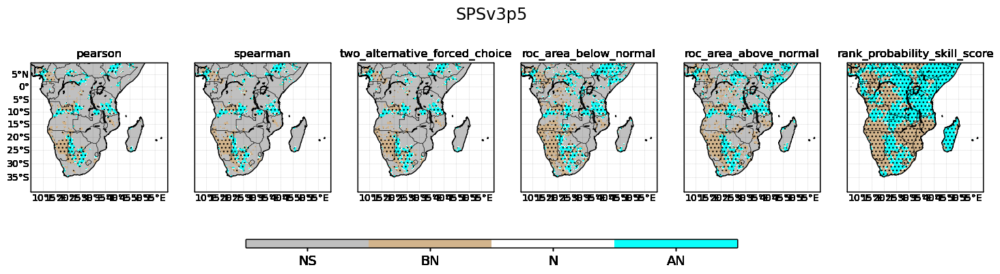

In [31]:
n_datasets = len(forecasts)
fig_format = functions_py.fig_format(n_datasets)

fig = plt.figure(figsize=(18,6))
fig_array = [1, 6]

no_labels = [0,0,0,0]
left_labels = [1, 0, 0, 0]
bottom_labels = [0, 0, 0, 1]

label_parallels = [left_labels, no_labels, no_labels, no_labels, no_labels, no_labels]
label_meridians = [bottom_labels, bottom_labels, bottom_labels, bottom_labels, bottom_labels, bottom_labels]

for model in forecasts:
    
    j = 0
    for skill in skill_metrics:
        j = j+1
        ax = fig.add_subplot(fig_array[0], fig_array[1], j)
        model_name = model.split('/')[-1].split('.')[0]
        skill_scores_file = data_dir +  model_name +'.' + predictor_var + '_skillscores_' + mos_lc +'.nc'
        forecast = xr.open_dataset(model)#.deterministic
        skill_scores = xr.open_dataset(skill_scores_file)
    
        skill_score_1 = skill_scores[skill]
        if skill in ['pearson', 'spearman']:
            #skillful = (skill_score_1.where(skill_score_1 > 0.3)/skill_score_1.where(skill_score_1 > 0.3))
            skillful = skill_score_1.where(skill_score_1 > 0.3,  0).where(skill_score_1 < 0.3,  1)
        elif skill in [ 'two_alternative_forced_choice' ] :
            skillful = skill_score_1.where(skill_score_1 > 60,  0).where(skill_score_1 < 60,  1)
        elif skill == 'rank_probability_skill_score' :
            skillful = skill_score_1.where(skill_score_1 > 0.2,  0).where(skill_score_1 < 0.2,  1)
        elif skill in ["roc_area_below_normal", "roc_area_above_normal"] :
            skillful = skill_score_1.where(skill_score_1 > 0.6,  0).where(skill_score_1 < 0.6,  1)
            #skillful = (skill_score_1.where(skill_score_1 > 0.6)/skill_score_1.where(skill_score_1 > 0.6))
        else:
            print('Try next time')
    
        below_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[0].drop_vars('C')
        normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[1].drop_vars('C')
        above_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[2].drop_vars('C')
    
        probabilistic_forecast = xr.merge([(below_normal/below_normal)*1, (normal/normal)*2, (above_normal/above_normal)*3])['probabilistic']
        
        lons = probabilistic_forecast['X'][:]
        lats = probabilistic_forecast['Y'][:]
        
        map = Basemap ( projection ='mill',llcrnrlon=np.min(lons).values,urcrnrlon=np.max(lons).values, 
                       llcrnrlat=np.min(lats).values,urcrnrlat=np.max(lats).values,resolution='l')
        x2d, y2d = map(*np.meshgrid(lons,lats))
        levs = np.arange(-0.5,4,1) 
        hatches = [None, '...']
        levs_pval = np.arange(-1,2, 1)
        ticklabels=['NS', 'BN', 'N', 'AN']
        #levs = np.array([1,2,3,4,])*5/4 - 0.6
       
        cmap=colors.ListedColormap(['silver', '#d2b48c', 'white','#0bfffb']) # colormap for tercile forecast
        pl1 = map.contourf(x2d,y2d,probabilistic_forecast[0,:,:]*skillful,levs,cmap=cmap, vmin = 0, vmax = 4)
        ab2 = map.contourf(x2d,y2d,skillful[:,:],levs_pval,hatches=hatches, colors = 'none')
        map.drawcoastlines()
        map.drawcountries()   
       
        map.drawparallels(np.arange(-80., 81., 5), \
            labels=label_parallels[j-1], fontsize=10,linewidth=0.1)
        map.drawmeridians(np.arange(-180., 181., 5),\
            labels=label_meridians[j-1], fontsize=10,linewidth=0.1)
        ax.set_title(skill)
        #props = dict(boxstyle='round', facecolor='wheat', alpha=1)
        #ax.text(0.04, 0.95, skill, fontsize=12, verticalalignment='top', transform=ax.transAxes, bbox=props)
    
    cax = fig.add_axes([0.3, 0.2, 0.4, 0.02])   
    bar = fig.colorbar(pl1, cax=cax, orientation='horizontal', ticks=[0, 1, 2, 3] )
    bar.ax.tick_params(labelsize=14) 
    bar.set_ticklabels(ticklabels)
    fig.suptitle(model_name, y = 0.79, fontsize = 'xx-large')
    plt.savefig(data_dir + '../figures/by_model/'+model_name+'_skill_masked.png', bbox_inches='tight',dpi=300)

In [ ]:
n_datasets = len(forecasts)
fig_format = functions_py.fig_format(n_datasets)

fig = plt.figure(figsize=(18,6))
fig_array = [1, 6]

no_labels = [0,0,0,0]
left_labels = [1, 0, 0, 0]
bottom_labels = [0, 0, 0, 1]

label_parallels = [left_labels, no_labels, no_labels, no_labels, no_labels, no_labels]
label_meridians = [bottom_labels, bottom_labels, bottom_labels, bottom_labels, bottom_labels, bottom_labels]

for model in forecasts:
    
    j = 0
    for skill in skill_metrics:
        j = j+1
        ax = fig.add_subplot(fig_array[0], fig_array[1], j)
        model_name = model.split('/')[-1].split('.')[0]
        skill_scores_file = data_dir +  model_name +'.' + predictor_var + '_skillscores_' + mos_lc +'.nc'
        forecast = xr.open_dataset(model)#.deterministic
        skill_scores = xr.open_dataset(skill_scores_file)
    
        skill_score_1 = skill_scores[skill]

        if skill in ['pearson', 'spearman']:
            #skillful = (skill_score_1.where(skill_score_1 > 0.3)/skill_score_1.where(skill_score_1 > 0.3))
            skillful = skill_score_1.where(skill_score_1 > 0.3,  0).where(skill_score_1 < 0.3,  1)
        elif skill == 'rank_probability_skill_score' :
            skillful = skill_score_1.where(skill_score_1 > 0.2,  0).where(skill_score_1 < 0.2,  1)    
        elif skill == 'two_alternative_forced_choice' :
            skillful = skill_score_1.where(skill_score_1 > 60,  0).where(skill_score_1 < 60,  1)
        elif skill in ["roc_area_below_normal", "roc_area_above_normal"] :
            skillful = skill_score_1.where(skill_score_1 > 0.6,  0).where(skill_score_1 < 0.6,  1)
            #skillful = (skill_score_1.where(skill_score_1 > 0.6)/skill_score_1.where(skill_score_1 > 0.6))
        else:
            print('Try next time')
    
        below_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[0].drop_vars('C')
        normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[1].drop_vars('C')
        above_normal = forecast['probabilistic'].where(forecast['probabilistic'] == forecast['probabilistic'].max('C'))[2].drop_vars('C')
    
        probabilistic_forecast = xr.merge([(below_normal/below_normal)*1, (normal/normal)*2, (above_normal/above_normal)*3])['probabilistic']
        
        lons = probabilistic_forecast['X'][:]
        lats = probabilistic_forecast['Y'][:]
        
        map = Basemap ( projection ='mill',llcrnrlon=np.min(lons).values,urcrnrlon=np.max(lons).values, 
                       llcrnrlat=np.min(lats).values,urcrnrlat=np.max(lats).values,resolution='l')
        x2d, y2d = map(*np.meshgrid(lons,lats))
        levs = np.arange(0.5,4,1) 
        hatches = [None, '...']
        levs_pval = np.arange(-1,2, 1)
        ticklabels=['BN', 'N', 'AN']
        #levs = np.array([1,2,3,4,])*5/4 - 0.6
       
        cmap=colors.ListedColormap(['#d2b48c', 'white','#0bfffb']) # colormap for tercile forecast
        pl1 = map.contourf(x2d,y2d,probabilistic_forecast[0,:,:],levs,cmap=cmap, vmin = 0, vmax = 4)
        ab2 = map.contourf(x2d,y2d,skillful[:,:],levs_pval,hatches=hatches, colors = 'none')
        map.drawcoastlines()
        map.drawcountries()   
       
        map.drawparallels(np.arange(-80., 81., 5), \
            labels=label_parallels[j-1], fontsize=10,linewidth=0.1)
        map.drawmeridians(np.arange(-180., 181., 5),\
            labels=label_meridians[j-1], fontsize=10,linewidth=0.1)
        ax.set_title(skill)
        #props = dict(boxstyle='round', facecolor='wheat', alpha=1)
        #ax.text(0.04, 0.95, skill, fontsize=12, verticalalignment='top', transform=ax.transAxes, bbox=props)
    
    cax = fig.add_axes([0.3, 0.2, 0.4, 0.02])   
    bar = fig.colorbar(pl1, cax=cax, orientation='horizontal', ticks=[ 1, 2, 3] )
    bar.ax.tick_params(labelsize=14) 
    bar.set_ticklabels(ticklabels)
    fig.suptitle(model_name, y = 0.79, fontsize = 'xx-large')
    plt.savefig(data_dir + '../figures/by_model/'+model_name+'_skill.png', bbox_inches='tight',dpi=300)

In [ ]:
xxx

# Multi-Model Ensemble

Choose which models to include in the MME, e.g.
```
ensemble = ['CFSv2.PRCP','SEAS5.PRCP']
```

In [ ]:
predictor_names 

In [ ]:
not_for_mme_CCA = ['GEMNEMO.PRCP']
not_for_mme_PCR = ['CCSM4.SST','CanCM4i.SST','CanSIPSIC3.SST','GEM5NEMO.SST','GEOSS2S.SST','CFSv2.SST','SPSv3p5.SST']

In [ ]:
predictor_names_1 = [
 'SPEAR.SST']

ensemble = predictor_names

In [ ]:
fcsts[0].keys()

In [ ]:
det_fcst, pr_fcst, pev_fcst, nextgen_skill = pycpt.construct_mme(fcsts, hcsts, Y, ensemble, predictor_names, cpt_args, domain_dir)

#### Plot MME Forecast Skill

Deterministic metrics: pearson, spearman, 2afc, roc_below, roc_above

Probabilistic metrics: generalized_roc, rank_probability_skill_score 

e.g.
```
skill_metrics = ["spearman", "generalized_roc"]
```

In [ ]:
skill_metrics = [
    "spearman",
    "2afc",
    "generalized_roc",
    "rank_probability_skill_score",
]

In [ ]:
pycpt.plot_mme_skill(predictor_names, nextgen_skill, MOS, domain_dir, skill_metrics)

#### Plot MME Forecasts

In [ ]:
pycpt.plot_mme_forecasts(cpt_args, predictand_name, pr_fcst, MOS, domain_dir, det_fcst)

#### Construct MME Flexible Forecasts (full PDF)

If `isPercentile` is `True`, the threshold is a percentile (e.g., 0.5)
else in the unit of the predictand (e.g., mm, degC, ...)

In [ ]:
threshold = 0.5
isPercentile = True

In [ ]:
exceedance_prob, fcst_scale, climo_scale, fcst_mu, climo_mu, Y2, ntrain, transformed_threshold = pycpt.construct_flex_fcst(MOS, cpt_args, det_fcst, threshold, isPercentile, Y, pev_fcst)

#### Plot Flexible MME Forecasts

Choose a gridpoint within the predictand domain to plot the forecast and climatological probability of exceedance and PDF curves. If set to None, the centroid of the predictand domain will be used.

If you want to use a different color bar than the one used by default, assign the name of the desired color bar to the variable **color_bar**, None value will use the default color bars. If you are unaware of the available color bars, run `get_colors_bars()`.

In [ ]:
point_latitude = None
point_longitude = None
color_bar = None

In [ ]:
pycpt.plot_mme_flex_forecasts(predictand_name, exceedance_prob, point_latitude, point_longitude, download_args["predictand_extent"], transformed_threshold, fcst_scale, climo_scale, fcst_mu, climo_mu, Y2, cpt_args['transform_predictand'], ntrain, Y, MOS, domain_dir,color_bar)

These final cells record information about the python environment that will be useful if we need to reproduce this configuration in the future.

In [ ]:
!conda list

In [ ]:
!conda list --explicit